In [1]:
from time import time
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
import matplotlib.cm as cm
import matplotlib.colors as colors
from itertools import product

import chromatix.functional as cx
from chromatix.ops import init_plane_resample
from chromatix.field import crop, pad

import jax
import jax.numpy as jnp
from jax import Array
# jax.config.update('jax_enable_x64', True)  # needed for 1e-9, 1e-6 order-of-magnitude beta/delta?
PI = jnp.pi

import optax
from jaxopt.projection import projection_non_negative
from flax import linen as nn
from flax.core import unfreeze, freeze

from xpc.psf import apply_psf
from xpc.transformations import rotate_volume
from xpc.xscatter import Material, get_wavenum, get_wavelen

tissue = Material('tissue', 'H(10.2)C(14.3)N(3.4)O(70.8)Na(0.2)P(0.3)S(0.3)Cl(0.2)K(0.3)', 1.06)
adipose = Material('adipose', 'H(11.4)C(59.8)N(0.7)O(27.8)Na(0.1)S(0.1)Cl(0.1)', 0.95) 
bone = Material('bone', 'H(3.4)C(15.5)N(4.2)O(43.5)Na(0.1)Mg(0.2)P(10.3)S(0.3)Ca(22.5)', 1.92)

# Multislice XPC-CT simulation \& AD-based phase retrieval

In [2]:
def make_raw_phantom(N, p0=1.0, p1=0.45, p2=0.35, c1=1, c2=1, id0=1, id1=2, id2=3, DTYPE=np.float64):
    # Make a phantom with 3 different spheres
    # p and c are scaling factors, location and size factors 
    # the ids are the fill values: 0=cylinder=1, 1=sphere=2, 2=sphere=3
    assert (p1 <= p0/2) and (p2 <= p0/2) and (p1 > 0) and (p2 > 0)
    coords = np.linspace(-N/2, N/2, N)
    Z, Y, X = np.meshgrid(coords, coords, coords)
    r1 = p1*N/2
    r2 = p2*N/2
    x1, y1, z1 = -c1*r1/np.sqrt(2), -c1*r1/np.sqrt(2), -r1/2
    x2, y2, z2 = c2*r2/np.sqrt(2), c2*r2/np.sqrt(2), r2/2
    obj = np.zeros([N,N,N], dtype=DTYPE)
    obj[np.where(X**2 + Y**2 < (p0*N/2)**2)] = id0
    obj[np.where((X-x1)**2 + (Y-y1)**2 + (Z-z1)**2 < r1**2)] = id1
    obj[np.where((X-x2)**2 + (Y-y2)**2 + (Z-z2)**2 < r2**2)] = id2
    return obj
    

## Forward model class `MultiSlicePBI`

In [3]:
%%time
    
class MultiSlicePBI(nn.Module): 

    # Simulation settings
    propdist = 10e-3
    energy = 10
    material_basis = {1:tissue, 2:bone}
             
    # Phantom
    phantom_Nx: int = 64 
    phantom_Ny: int = 30 
    phantom_dx: float = 0.5e-6
    phantom_fov = phantom_dx * phantom_Nx

    # Detector
    det_Nx: int = 64  # 32 -- TODO: should have det_N < phantom_N, but need to account for this in phantom init during recon!    
    det_Ny: int = 30  # 10
    det_fwhm: float = 1e-6
    det_psf: str = 'lorentzian'  # code for the PSF is in fun.py
    resampling_method: str = 'linear'
    I0: int = 1e8  # very low noise to start
    det_fov: float = phantom_fov
    det_dx: float = det_fov / det_Nx
    
    # Misc.
    wavelen = get_wavelen(energy)
    N_pad: int = 8   # note -- this is probably pushing the lower end of acceptable. Need to check?
    n_medium: float = 1
    cval = 1 + 0j

    def setup(self):
        
        self.volume = self.param(
            'volume',    # -- make this float64?
            lambda key, shape: jnp.stack((jnp.full((self.phantom_Nx, self.phantom_Ny, self.phantom_Nx), 1e-10),
                                          jnp.full((self.phantom_Nx, self.phantom_Ny, self.phantom_Nx), 1e-7)), axis=-1),  
            (self.phantom_Nx, self.phantom_Ny, self.phantom_Nx, 2),
        )

        # function to resample source field to detectory geometry
        self.det_resample_func = init_plane_resample(
            (self.det_Nx, self.det_Ny), 
            (self.det_dx, self.det_dx), 
            resampling_method=self.resampling_method
        )
    
    def __call__(self, angle: float) -> Array:

        volume = self.volume

        # TODO (for AD recon)
        ## -- the initial phantom volume will match detector geometry
        ## -- then, upsample the volume from detector res to phantom res for accurate forward project.
        ## -- currently, this takes an already upsampled phantom (not compatible with good recon)
        
        # incident wave
        field = cx.plane_wave(
            shape = (self.phantom_Nx, self.phantom_Ny),
            dx = self.phantom_dx,
            spectrum = self.wavelen,
            spectral_density = 1
        ) 
        field = field / field.intensity.max()**0.5 / (self.phantom_Nx / self.det_Nx) / (self.phantom_Ny / self.det_Ny) 
        
        # thru object
        rotated_vol = jax.vmap(
            rotate_volume, 
            in_axes=(-1, None)
        )(volume, angle)
        rotated_vol = jnp.swapaxes(jnp.stack([rotated_vol[0], rotated_vol[1]], axis=-1), 1, 2)

        # This time, multislice:
        obj_beta = rotated_vol[:,:,:,0]  # beta values 3D
        obj_delta = rotated_vol[:,:,:,1]  # delta values 3D
        propagator_transfer = cx.compute_transfer_propagator(pad(field, self.N_pad, cval=model.cval), self.phantom_dx, self.n_medium)
        exit_field = cx.multislice_thick_sample(field, obj_beta, obj_delta, self.n_medium, self.phantom_dx, self.N_pad, \
            propagator=propagator_transfer, reverse_propagate_distance=None)  

        # to detector
        det_field = cx.transfer_propagate(exit_field, self.propdist, self.n_medium, self.N_pad, cval=model.cval, mode='same')
        img = self.det_resample_func(det_field.intensity.squeeze()[...,None,None], field.dx.ravel()[:1])[...,0,0]
        img = img / (self.det_dx/self.phantom_dx)**2  # normalize counts to new pixel size
        img = img.swapaxes(0,1)      

        # TODO - consider cropping the top/bottom few rows (interference at cylinder bounds?)
        return img


# Set up model
key = jax.random.PRNGKey(3)  # pick any number
model = MultiSlicePBI()
params = model.init(key, 0)

   


CPU times: user 9.39 s, sys: 664 ms, total: 10.1 s
Wall time: 14.2 s


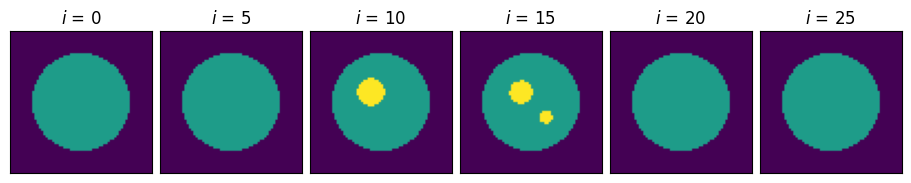

In [4]:
# make phantom after setting the model, since it depends on source energy.

Nx, Ny = model.phantom_Nx, model.phantom_Ny
vol_raw = make_raw_phantom(Nx, p0=0.7, p1=0.2, p2=0.1, id2=2, c1=1, c2=3)
subvol_raw = vol_raw[:,(Nx-Ny)//2:(Nx+Ny)//2,:]

delta_beta_phantom = np.zeros([Nx, Ny, Nx, 2])
for i, item in enumerate(model.material_basis.items()):
    idx, mat = item
    delta, beta = mat.delta_beta(model.energy)
    delta_beta_phantom[:,:,:,0][subvol_raw==idx] = beta # beta, 0
    delta_beta_phantom[:,:,:,1][subvol_raw==idx] = delta  # delta, 1
  
# View the phantom
fig, ax = plt.subplots(1, 6, figsize=[9,2], sharey=True, layout='constrained')
for i in range(len(ax)):
    yslice = i*Ny//len(ax)
    ax[i].set_title(f'$i$ = {yslice}')
    ax[i].imshow(delta_beta_phantom[:,yslice,:,1], vmin=0, vmax=delta_beta_phantom[:,:,:,1].max())
    ax[i].set_xticks([]); ax[i].set_yticks([])
plt.show()


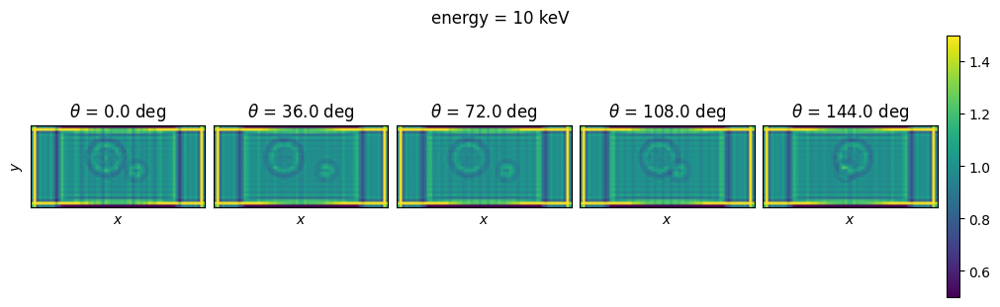

CPU times: user 7.4 s, sys: 195 ms, total: 7.6 s
Wall time: 7.88 s


In [5]:
%%time 

# For simulation, replace the params with the phantom data (instead of the zeros).
params = unfreeze(params)
params['params']['volume'] = delta_beta_phantom
params = freeze(params)

# Define the CT rotation angles
tot_theta = jnp.pi  
N_theta = 100
thetas = jnp.linspace(0, tot_theta*(1-1/N_theta), N_theta)

# Simulate
forward = jax.jit(jax.vmap(model.apply, in_axes=(None, 0)))
data = forward(params, thetas)
data = jax.random.poisson(key, model.I0*data, data.shape) / model.I0  # add noise

# Show
fig, ax = plt.subplots(1, 5, figsize=[10,3], sharey=True, layout='constrained')
fig.suptitle(f'energy = {model.energy} keV')
for i in range(len(ax)):
    i_theta = i*N_theta//len(ax)
    m = ax[i].imshow(data[i_theta,:,:], vmin=0.5, vmax=1.5)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_xlabel('$x$')
    ax[0].set_ylabel('$y$')
    ax[i].set_title(f'$\\theta$ = {180*thetas[i_theta]/PI:.1f} deg')
fig.colorbar(m)
plt.show()

# Optimization-based recon (via AD)

In [6]:
# Regularization functions for the loss function:
def TV(img, axes=[0,1,2]):  
    tot_grad = 0
    for axi in axes:
        tot_grad += jnp.sum(jnp.abs(jnp.diff(img, axis=axi)))  
    return tot_grad
    
def L1(img):
    return jnp.abs(img).sum()


# Convenience function for showing the optimization progress
def show_compare(params, loss, kw={}):
    vol1 = params['params']['volume']
    y_index = vol1.shape[1]//2
    
    fig, ax = plt.subplots(1,3,figsize=[10,3], dpi=300, layout='constrained')
    
    ax[0].plot(loss)
    ax[0].set_title('loss')
    ax[0].set_yscale('log')
    ax[0].set_xlabel('iteration #')
    
    for i in range(2):
        axi = ax[i+1]
        m = axi.imshow(vol1[:,y_index,:,i], **kw) 
        axi.set_title(['beta', 'delta'][i])
        axi.set_xticks([])
        axi.set_yticks([])
        axi.set_xlabel('$x$')
        axi.set_ylabel('$z$')
        fig.colorbar(m, ax=axi)
    plt.show()
    

iter 0 (t = 8.0 s)


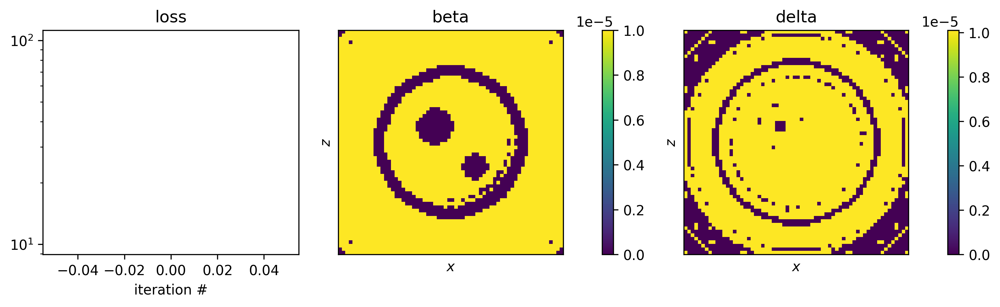

iter 1 (t = 17.0 s)
iter 2 (t = 17.0 s)
iter 3 (t = 17.1 s)
iter 4 (t = 17.2 s)
iter 5 (t = 17.3 s)
iter 6 (t = 17.4 s)
iter 7 (t = 17.4 s)
iter 8 (t = 17.5 s)
iter 9 (t = 17.6 s)
iter 10 (t = 17.7 s)


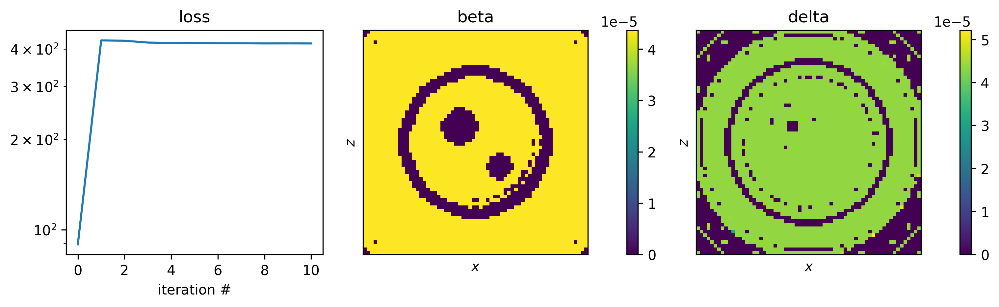

iter 11 (t = 18.7 s)
iter 12 (t = 18.8 s)
iter 13 (t = 18.9 s)
iter 14 (t = 19.0 s)
iter 15 (t = 19.0 s)
iter 16 (t = 19.1 s)
iter 17 (t = 19.2 s)
iter 18 (t = 19.3 s)
iter 19 (t = 19.4 s)
iter 20 (t = 19.4 s)


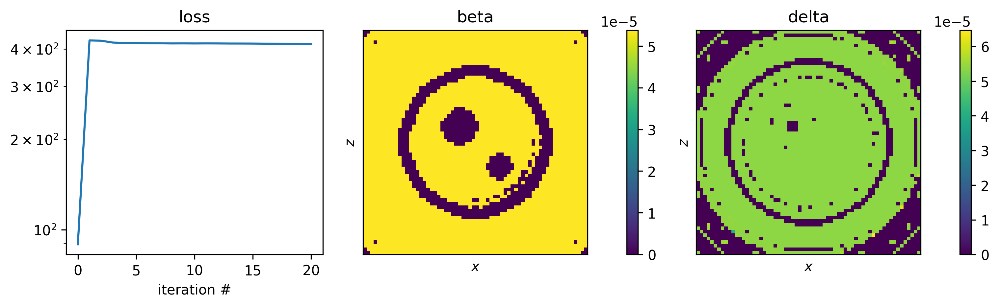

iter 21 (t = 20.5 s)
iter 22 (t = 20.6 s)
iter 23 (t = 20.6 s)
iter 24 (t = 20.7 s)
iter 25 (t = 20.8 s)
iter 26 (t = 20.9 s)
iter 27 (t = 21.0 s)
iter 28 (t = 21.0 s)
iter 29 (t = 21.1 s)
iter 30 (t = 21.2 s)


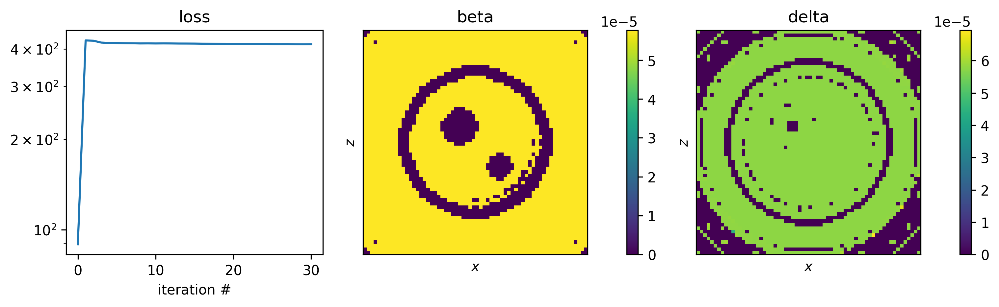

CPU times: user 20.1 s, sys: 959 ms, total: 21.1 s
Wall time: 22.6 s


In [7]:
%%time 

max_iter = 31
show_iter = 10

LRATE = 1e-5
EPS = 1e-8
optimizer = optax.adam(learning_rate=LRATE, eps=EPS)

# TODO -- tune the regularization weights. For now, all regularization is "off"
w_tv_beta = 0
w_tv_delta = 0
w_l1_beta = 0
w_l1_delta = 0

def loss_fn(params, data):
    vol = params['params']['volume']
    vol_beta, vol_delta = vol[:,:,:,0], vol[:,:,:,1]   
    y_k = forward(params, thetas)   
    L2_norm = jnp.sqrt(jnp.sum((y_k - data)**2)) 
    L1_delta_term = w_l1_delta*L1(vol_delta)            
    L1_beta_term = w_l1_beta*L1(vol_beta)
    TV_delta_term = w_tv_delta*TV(vol_delta)
    TV_beta_term = w_tv_beta*TV(vol_beta)
    loss = L2_norm + L1_delta_term + L1_beta_term + TV_delta_term + TV_beta_term 
    return loss

@jax.jit  
def update(params, opt_state, *args):
    loss, grads = jax.value_and_grad(loss_fn)(params, *args)
    updates, opt_state = optimizer.update(grads, opt_state, params,value=loss, grad=grads, value_fn=loss_fn)
    params = projection_non_negative(optax.apply_updates(params, updates))
    return params, opt_state, loss

    
###################################

# # Init the model
key = jax.random.PRNGKey(3)
model = MultiSlicePBI()
params = model.init(key, 0)
forward = jax.vmap(model.apply, in_axes=(None, 0))  
opt_state = optimizer.init(params)  

# # Run
loss = []
t0 = time()
for iter_k in range(max_iter):
    params, opt_state, loss_k = update(params, opt_state, data)
    loss.append(loss_k)
    print(f'iter {iter_k} (t = {time() - t0:.1f} s)')
    
    if (iter_k%show_iter == 0):
        show_compare(params, loss)  
    


## optimize regularization weights \& produce a parallel coordinates plot

In [8]:
def calculate_rmse(vol):  
    """
    use this as the figure of merit to compare weights.
    Note that since delta has a much larger true order of magnitude 
    than beta, it probably overpowers this metric. 
    Better figure of merit ideas?
    """
    rmse = np.sqrt(np.mean((vol - delta_beta_phantom) ** 2))
    return rmse


##### | TV_beta: 0.0  | TV_delta: 0.0  | L1_beta: 0.0  | L1_delta: 0.0
iter 30 (t = 17.6 s)


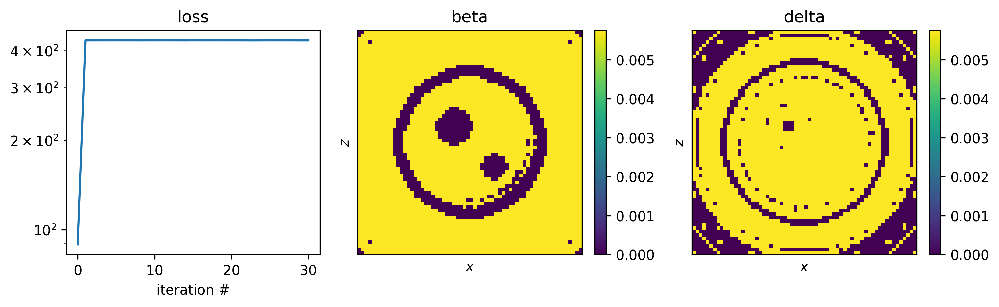


##### | TV_beta: 0.0  | TV_delta: 0.0  | L1_beta: 0.0  | L1_delta: 5.0
iter 30 (t = 17.6 s)


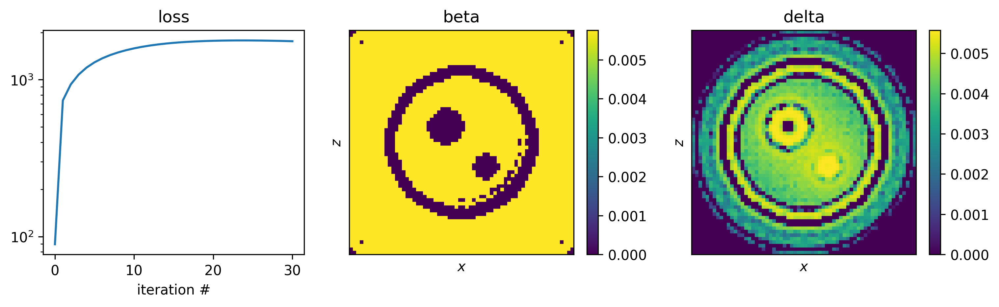


##### | TV_beta: 0.0  | TV_delta: 0.0  | L1_beta: 0.0  | L1_delta: 10.0
iter 30 (t = 17.4 s)


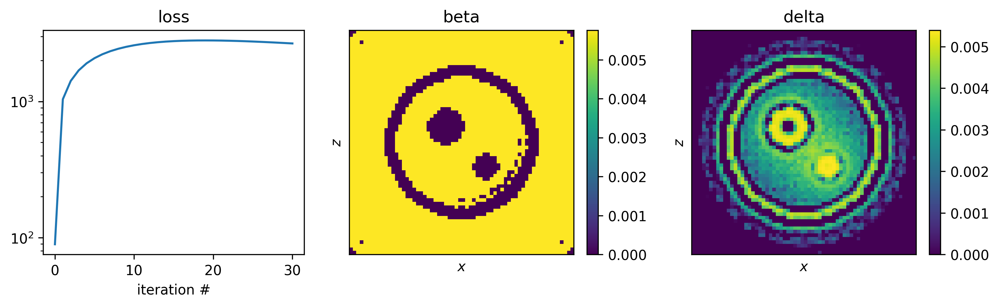


##### | TV_beta: 0.0  | TV_delta: 0.0  | L1_beta: 5.0  | L1_delta: 0.0
iter 30 (t = 17.5 s)


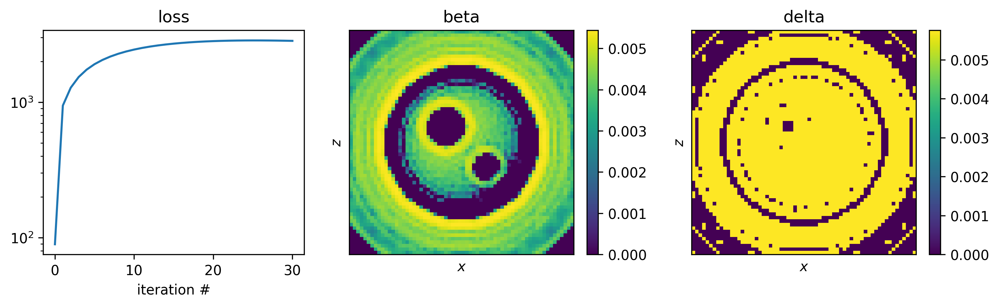


##### | TV_beta: 0.0  | TV_delta: 0.0  | L1_beta: 5.0  | L1_delta: 5.0
iter 30 (t = 18.1 s)


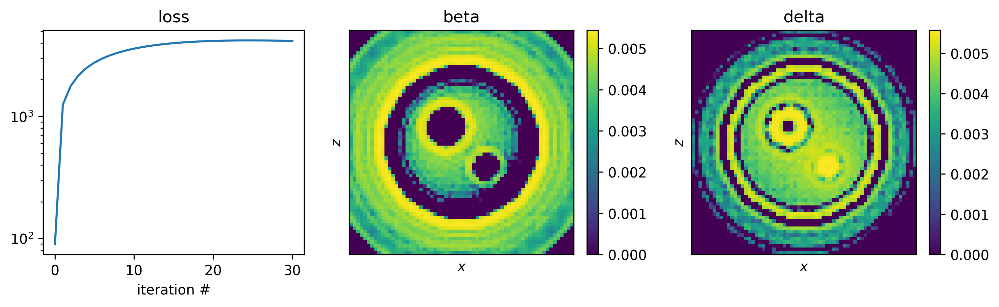


##### | TV_beta: 0.0  | TV_delta: 0.0  | L1_beta: 5.0  | L1_delta: 10.0
iter 30 (t = 17.8 s)


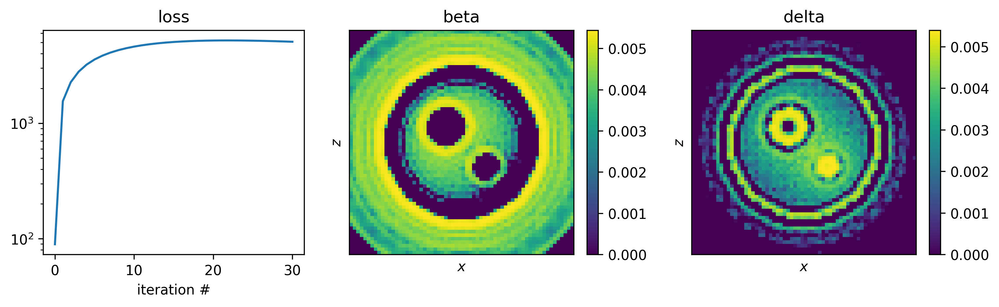


##### | TV_beta: 0.0  | TV_delta: 0.0  | L1_beta: 10.0  | L1_delta: 0.0
iter 30 (t = 17.6 s)


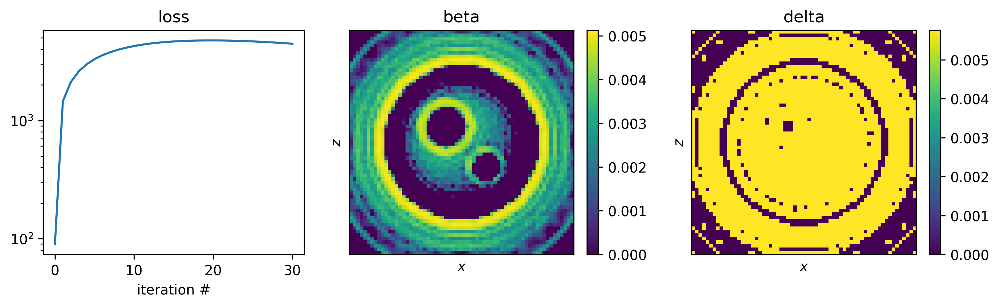


##### | TV_beta: 0.0  | TV_delta: 0.0  | L1_beta: 10.0  | L1_delta: 5.0
iter 30 (t = 18.2 s)


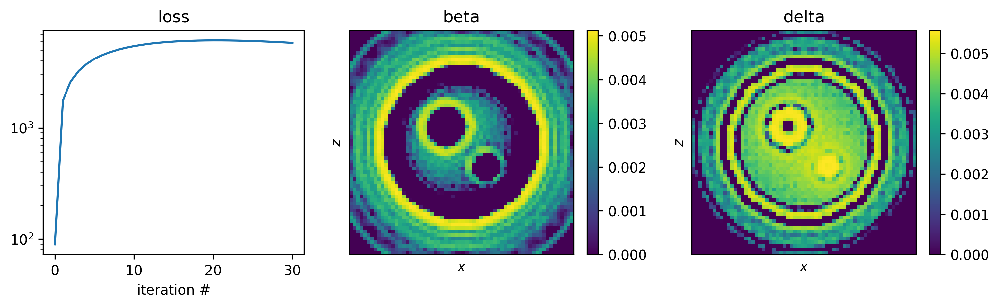


##### | TV_beta: 0.0  | TV_delta: 0.0  | L1_beta: 10.0  | L1_delta: 10.0
iter 30 (t = 17.6 s)


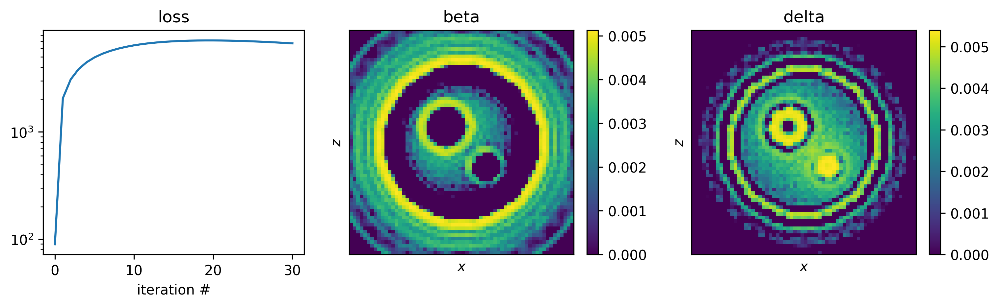


##### | TV_beta: 0.0  | TV_delta: 5.0  | L1_beta: 0.0  | L1_delta: 0.0
iter 30 (t = 18.0 s)


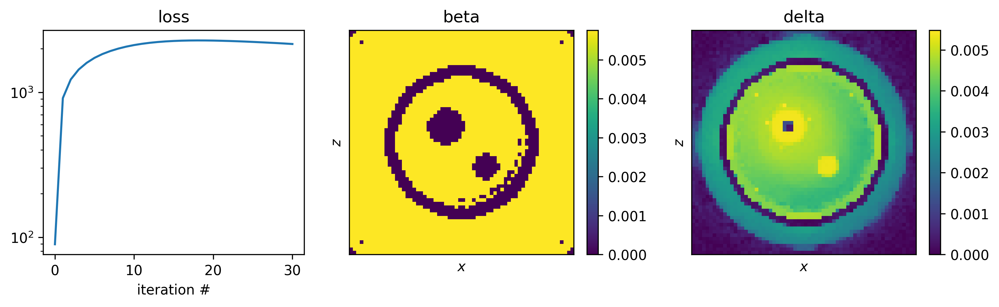


##### | TV_beta: 0.0  | TV_delta: 5.0  | L1_beta: 0.0  | L1_delta: 5.0
iter 30 (t = 17.5 s)


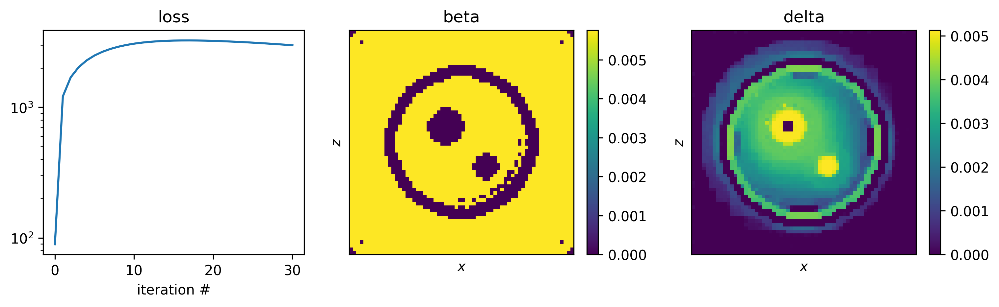


##### | TV_beta: 0.0  | TV_delta: 5.0  | L1_beta: 0.0  | L1_delta: 10.0
iter 30 (t = 17.6 s)


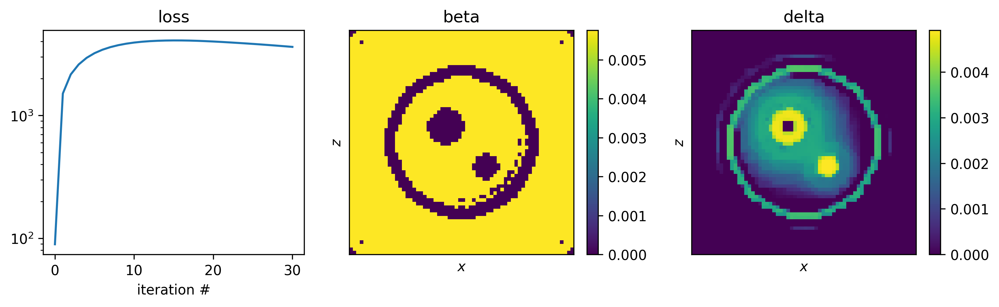


##### | TV_beta: 0.0  | TV_delta: 5.0  | L1_beta: 5.0  | L1_delta: 0.0
iter 30 (t = 17.7 s)


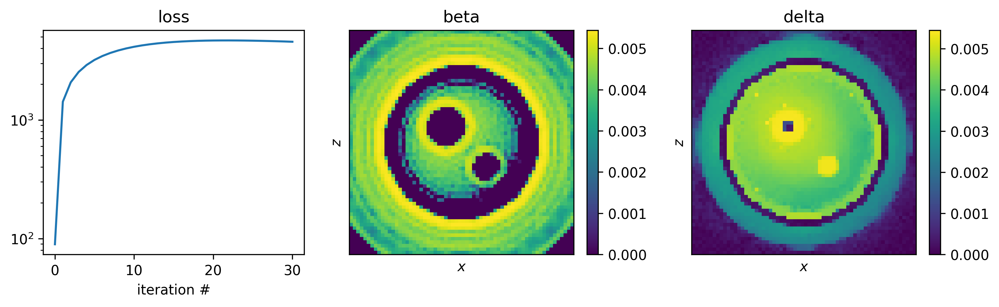


##### | TV_beta: 0.0  | TV_delta: 5.0  | L1_beta: 5.0  | L1_delta: 5.0
iter 30 (t = 17.8 s)


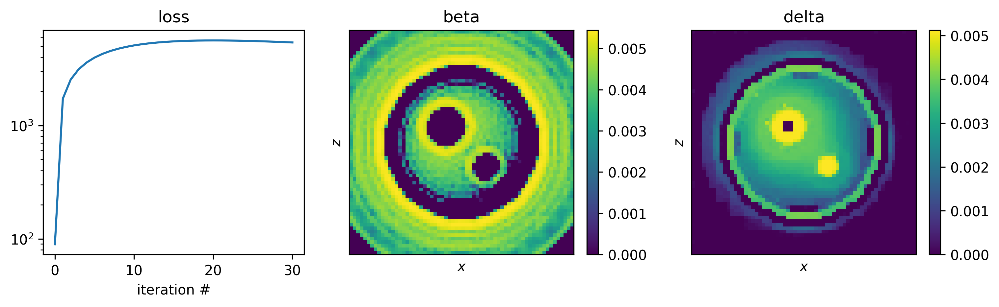


##### | TV_beta: 0.0  | TV_delta: 5.0  | L1_beta: 5.0  | L1_delta: 10.0
iter 30 (t = 17.9 s)


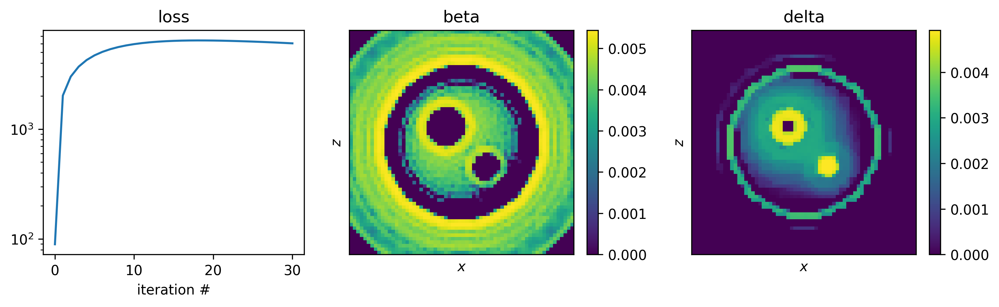


##### | TV_beta: 0.0  | TV_delta: 5.0  | L1_beta: 10.0  | L1_delta: 0.0
iter 30 (t = 17.7 s)


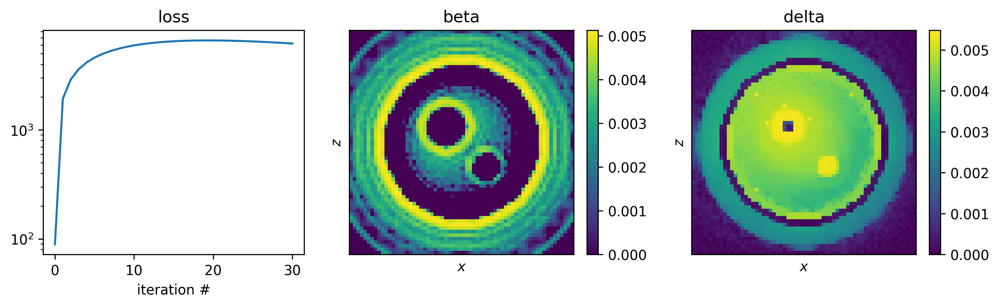


##### | TV_beta: 0.0  | TV_delta: 5.0  | L1_beta: 10.0  | L1_delta: 5.0
iter 30 (t = 17.9 s)


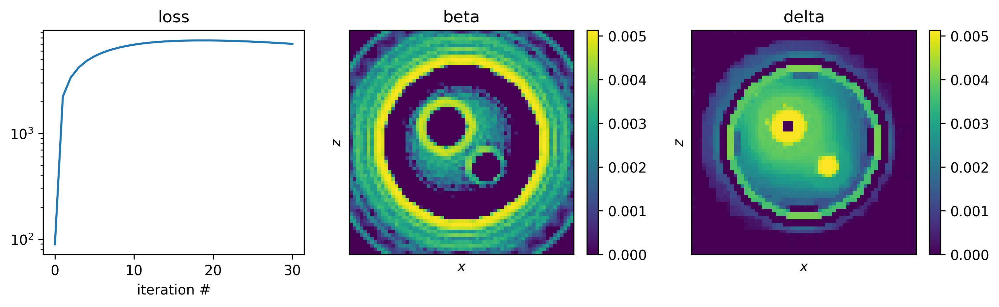


##### | TV_beta: 0.0  | TV_delta: 5.0  | L1_beta: 10.0  | L1_delta: 10.0
iter 30 (t = 17.8 s)


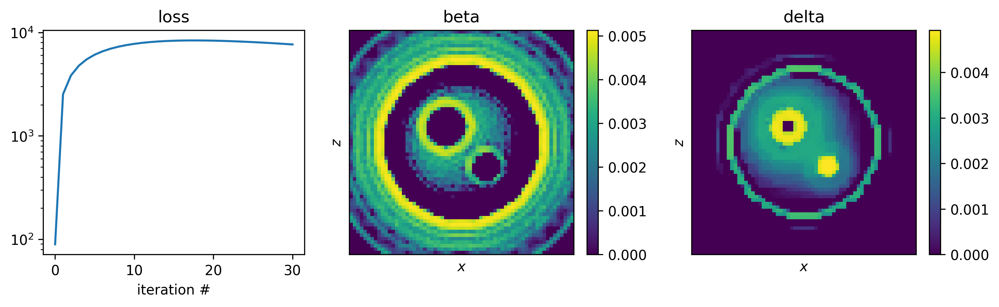


##### | TV_beta: 0.0  | TV_delta: 10.0  | L1_beta: 0.0  | L1_delta: 0.0
iter 30 (t = 17.6 s)


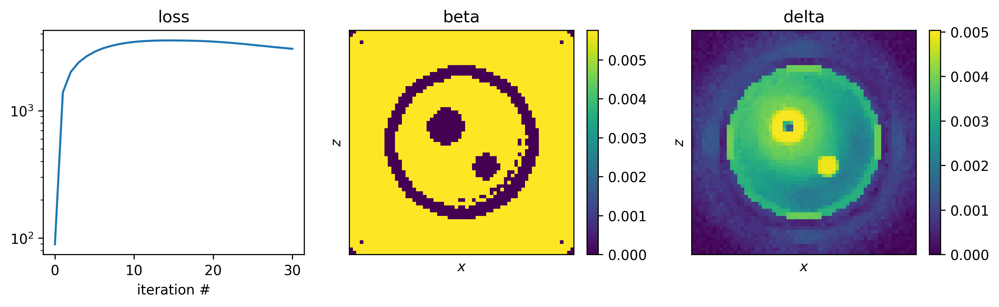


##### | TV_beta: 0.0  | TV_delta: 10.0  | L1_beta: 0.0  | L1_delta: 5.0
iter 30 (t = 17.8 s)


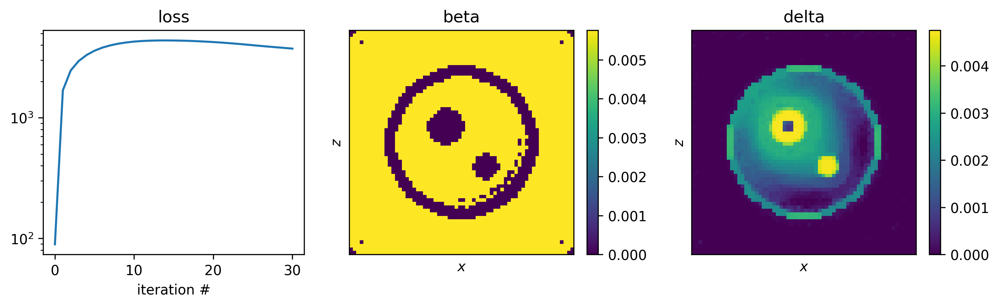


##### | TV_beta: 0.0  | TV_delta: 10.0  | L1_beta: 0.0  | L1_delta: 10.0
iter 30 (t = 18.1 s)


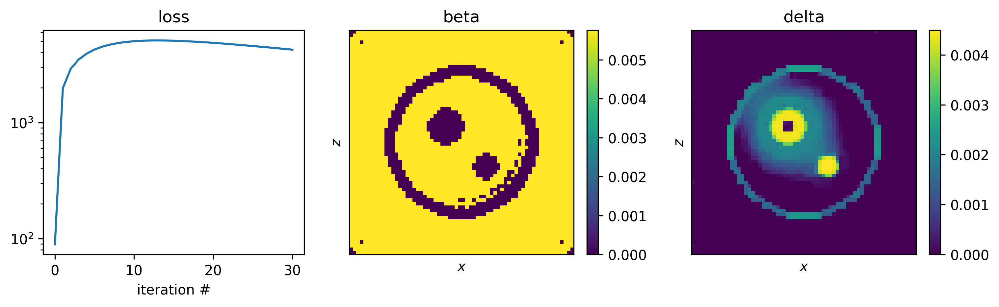


##### | TV_beta: 0.0  | TV_delta: 10.0  | L1_beta: 5.0  | L1_delta: 0.0
iter 30 (t = 17.6 s)


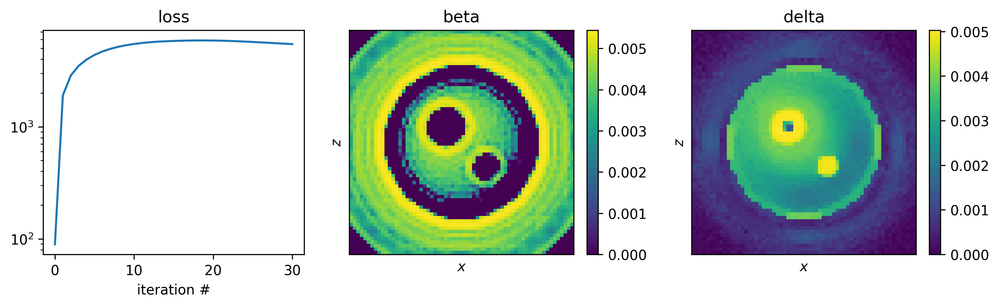


##### | TV_beta: 0.0  | TV_delta: 10.0  | L1_beta: 5.0  | L1_delta: 5.0
iter 30 (t = 18.1 s)


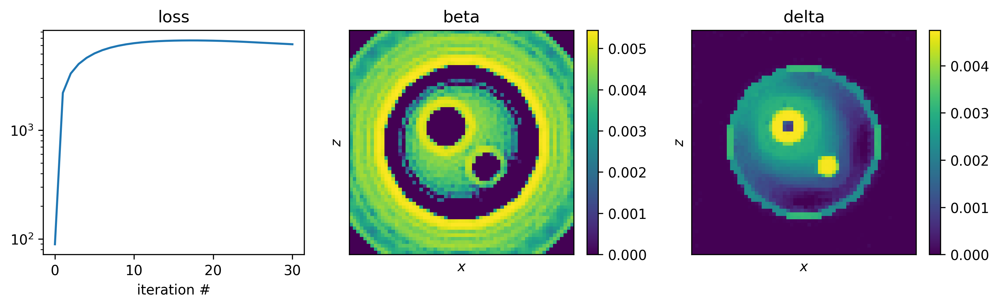


##### | TV_beta: 0.0  | TV_delta: 10.0  | L1_beta: 5.0  | L1_delta: 10.0
iter 30 (t = 17.8 s)


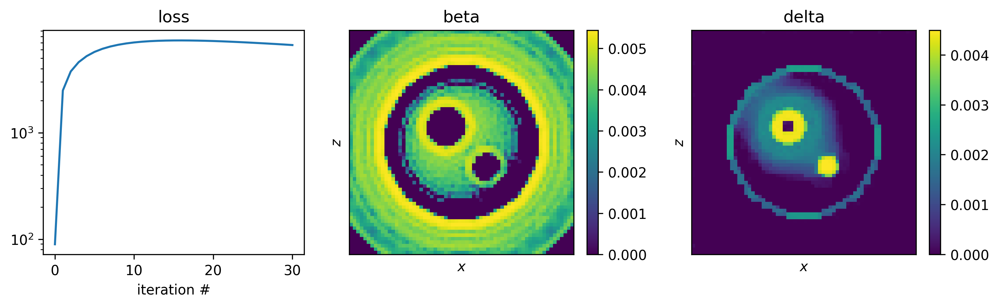


##### | TV_beta: 0.0  | TV_delta: 10.0  | L1_beta: 10.0  | L1_delta: 0.0
iter 30 (t = 17.9 s)


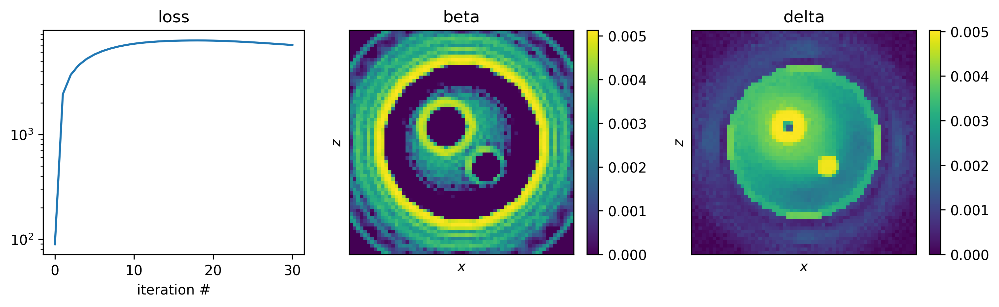


##### | TV_beta: 0.0  | TV_delta: 10.0  | L1_beta: 10.0  | L1_delta: 5.0
iter 30 (t = 17.8 s)


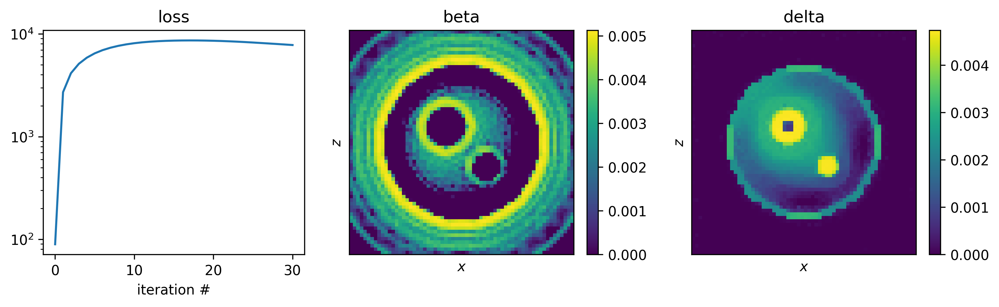


##### | TV_beta: 0.0  | TV_delta: 10.0  | L1_beta: 10.0  | L1_delta: 10.0
iter 30 (t = 18.0 s)


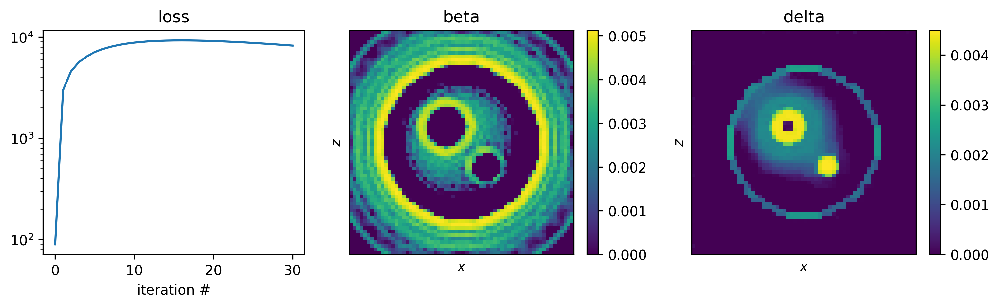


##### | TV_beta: 5.0  | TV_delta: 0.0  | L1_beta: 0.0  | L1_delta: 0.0
iter 30 (t = 17.6 s)


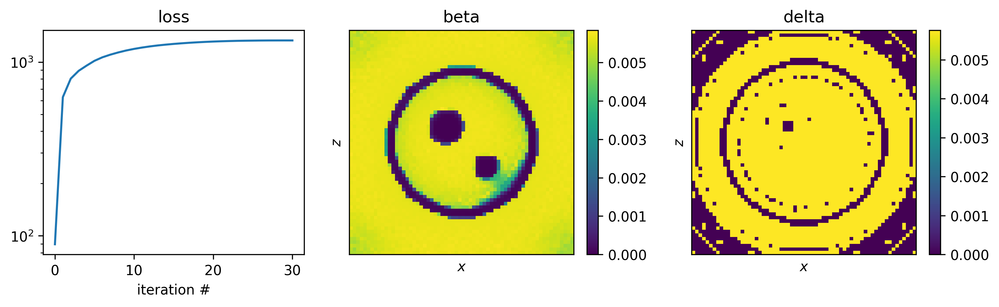


##### | TV_beta: 5.0  | TV_delta: 0.0  | L1_beta: 0.0  | L1_delta: 5.0
iter 30 (t = 17.7 s)


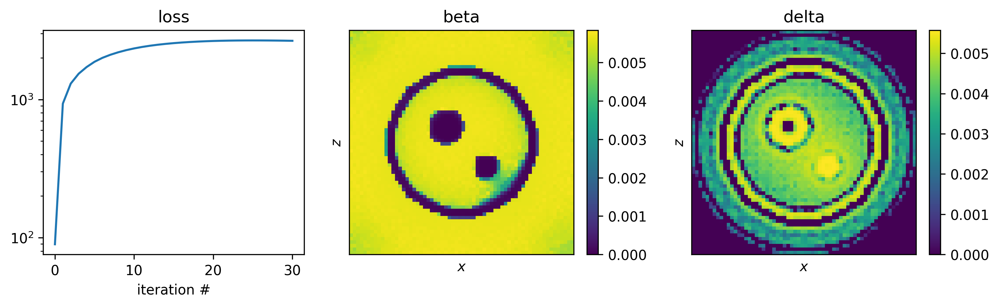


##### | TV_beta: 5.0  | TV_delta: 0.0  | L1_beta: 0.0  | L1_delta: 10.0
iter 30 (t = 17.6 s)


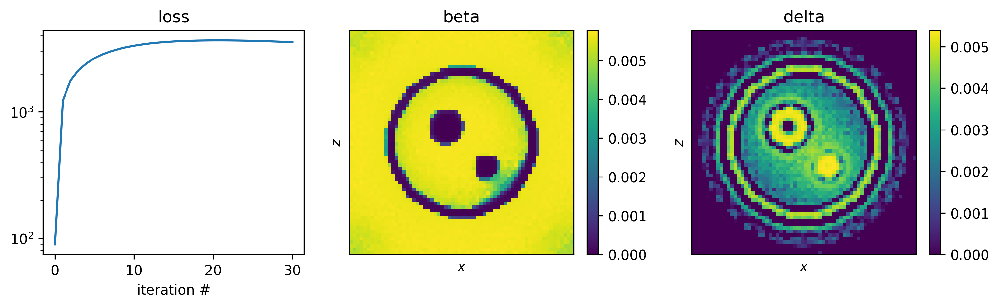


##### | TV_beta: 5.0  | TV_delta: 0.0  | L1_beta: 5.0  | L1_delta: 0.0
iter 30 (t = 17.9 s)


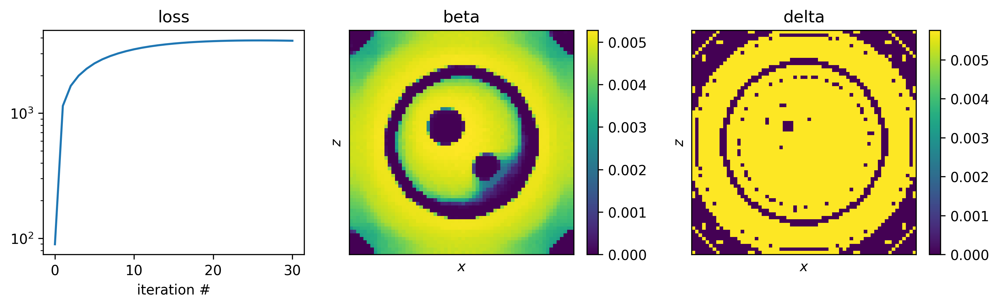


##### | TV_beta: 5.0  | TV_delta: 0.0  | L1_beta: 5.0  | L1_delta: 5.0
iter 30 (t = 17.9 s)


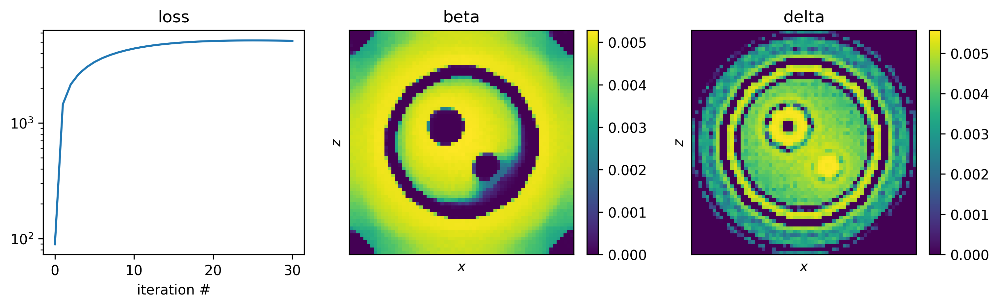


##### | TV_beta: 5.0  | TV_delta: 0.0  | L1_beta: 5.0  | L1_delta: 10.0
iter 30 (t = 18.3 s)


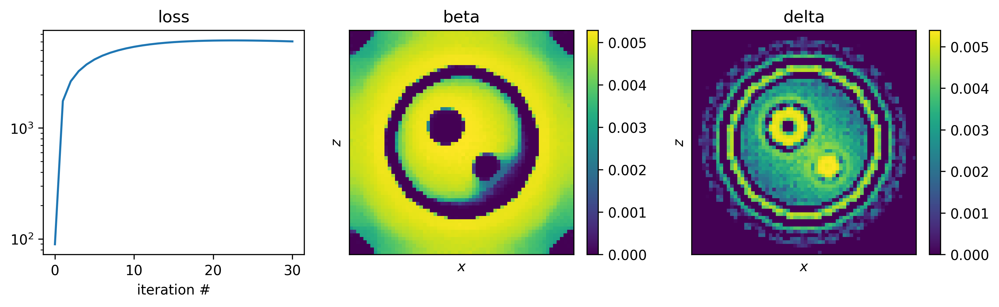


##### | TV_beta: 5.0  | TV_delta: 0.0  | L1_beta: 10.0  | L1_delta: 0.0
iter 30 (t = 17.7 s)


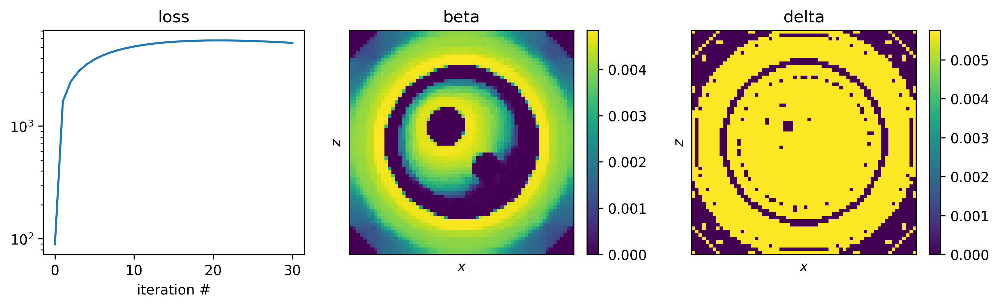


##### | TV_beta: 5.0  | TV_delta: 0.0  | L1_beta: 10.0  | L1_delta: 5.0
iter 30 (t = 17.9 s)


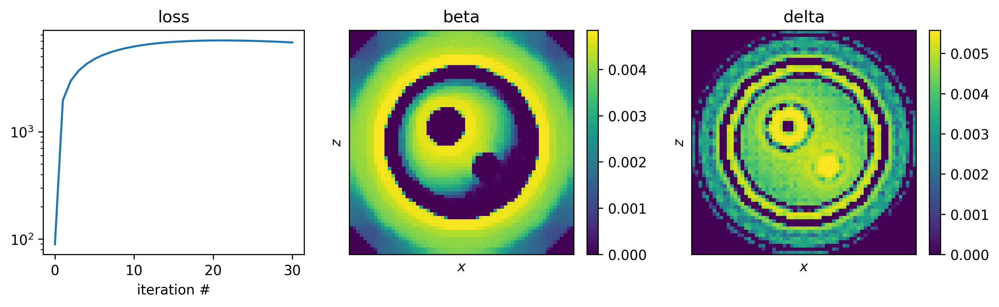


##### | TV_beta: 5.0  | TV_delta: 0.0  | L1_beta: 10.0  | L1_delta: 10.0
iter 30 (t = 17.5 s)


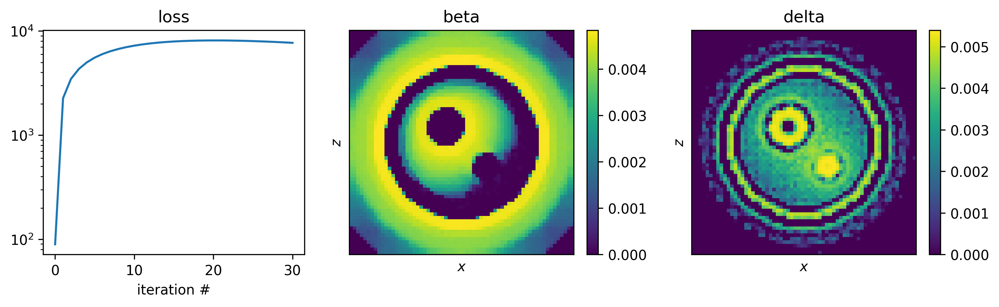


##### | TV_beta: 5.0  | TV_delta: 5.0  | L1_beta: 0.0  | L1_delta: 0.0
iter 30 (t = 18.0 s)


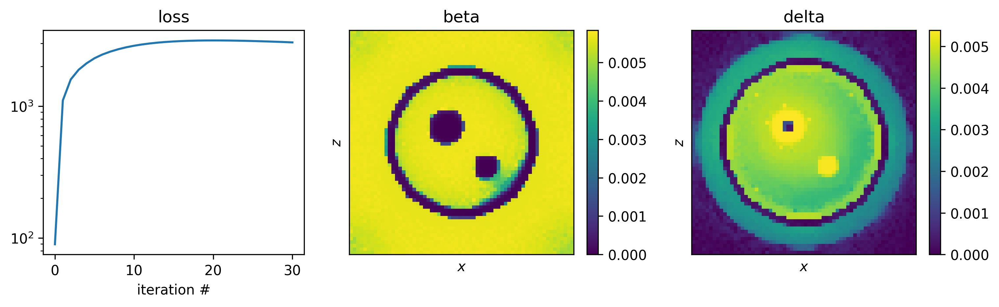


##### | TV_beta: 5.0  | TV_delta: 5.0  | L1_beta: 0.0  | L1_delta: 5.0
iter 30 (t = 17.9 s)


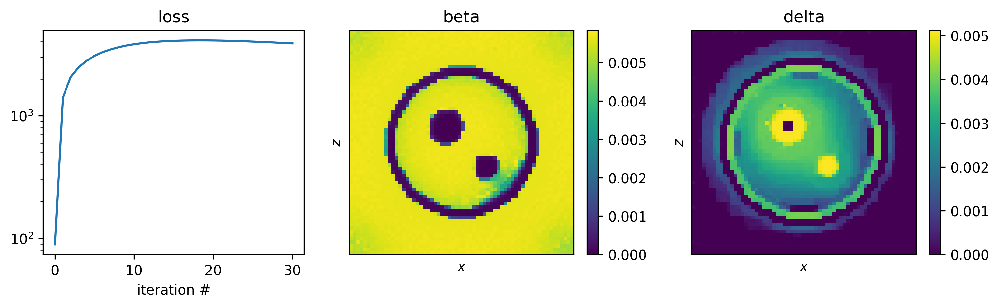


##### | TV_beta: 5.0  | TV_delta: 5.0  | L1_beta: 0.0  | L1_delta: 10.0
iter 30 (t = 18.2 s)


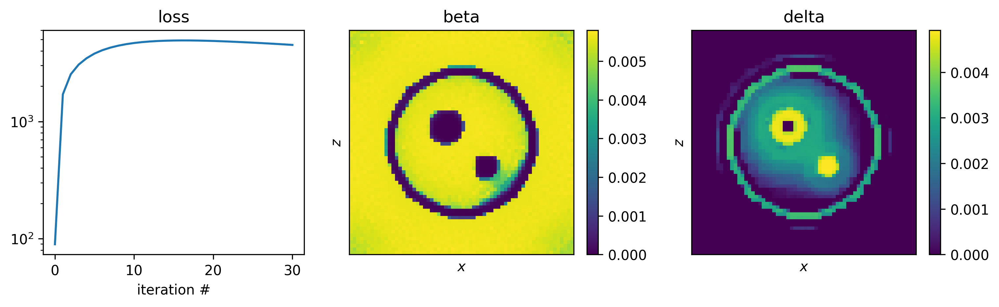


##### | TV_beta: 5.0  | TV_delta: 5.0  | L1_beta: 5.0  | L1_delta: 0.0
iter 30 (t = 18.1 s)


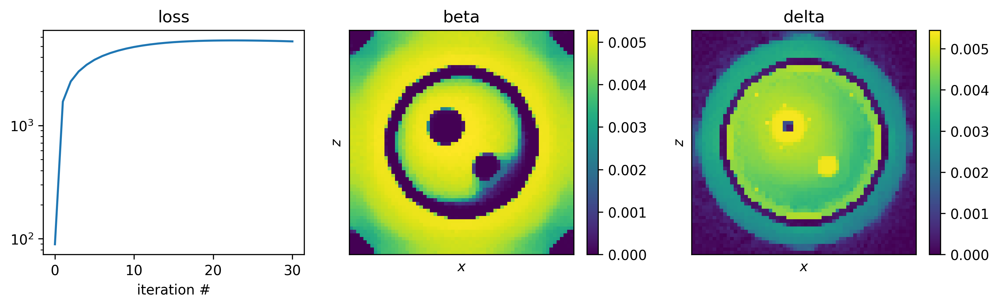


##### | TV_beta: 5.0  | TV_delta: 5.0  | L1_beta: 5.0  | L1_delta: 5.0
iter 30 (t = 18.3 s)


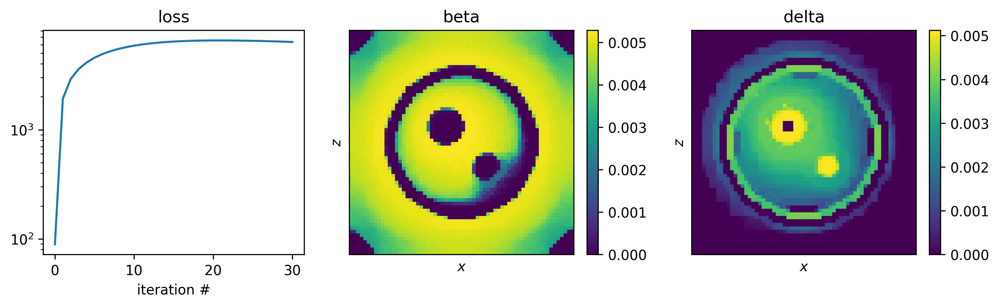


##### | TV_beta: 5.0  | TV_delta: 5.0  | L1_beta: 5.0  | L1_delta: 10.0
iter 30 (t = 17.9 s)


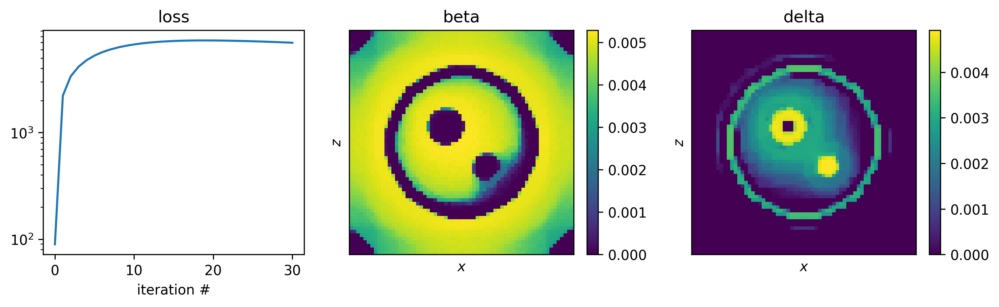


##### | TV_beta: 5.0  | TV_delta: 5.0  | L1_beta: 10.0  | L1_delta: 0.0
iter 30 (t = 18.1 s)


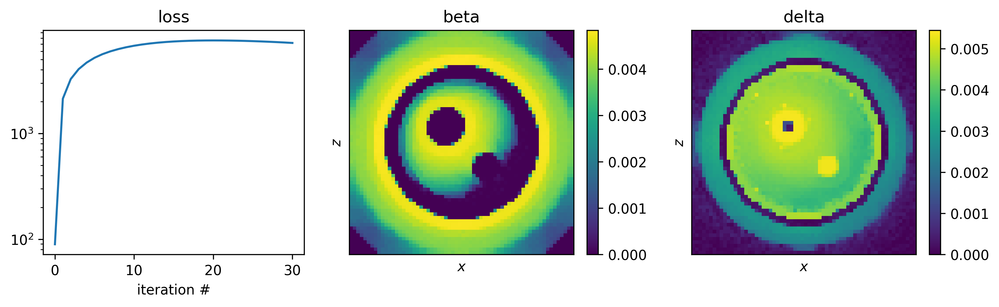


##### | TV_beta: 5.0  | TV_delta: 5.0  | L1_beta: 10.0  | L1_delta: 5.0
iter 30 (t = 17.8 s)


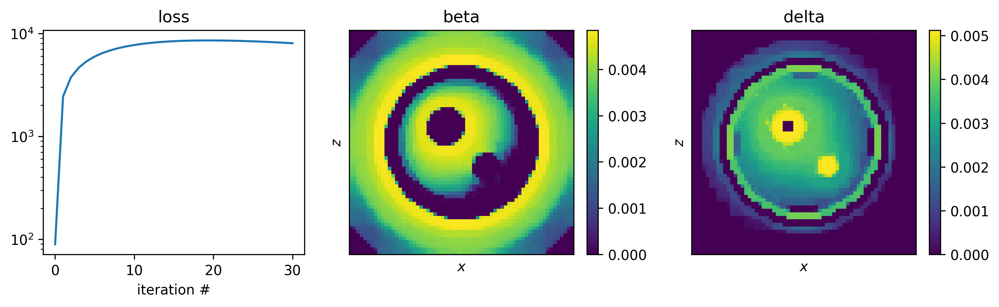


##### | TV_beta: 5.0  | TV_delta: 5.0  | L1_beta: 10.0  | L1_delta: 10.0
iter 30 (t = 18.0 s)


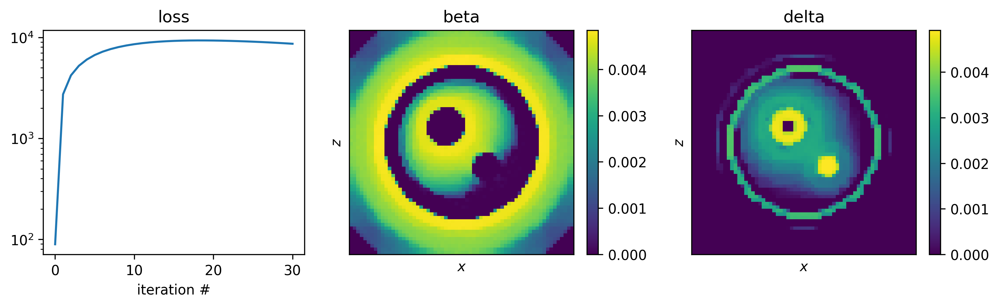


##### | TV_beta: 5.0  | TV_delta: 10.0  | L1_beta: 0.0  | L1_delta: 0.0
iter 30 (t = 18.0 s)


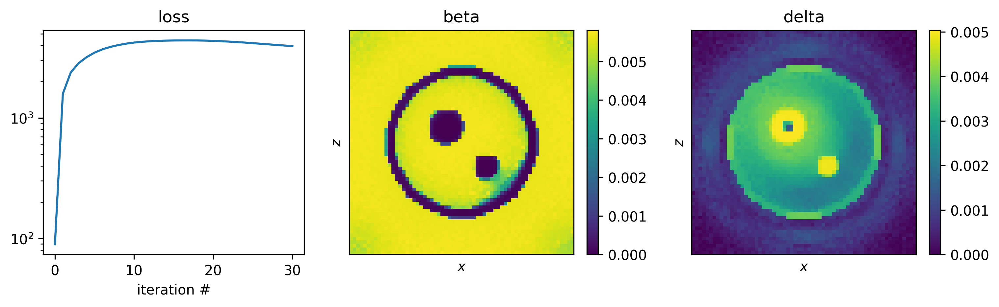


##### | TV_beta: 5.0  | TV_delta: 10.0  | L1_beta: 0.0  | L1_delta: 5.0
iter 30 (t = 18.2 s)


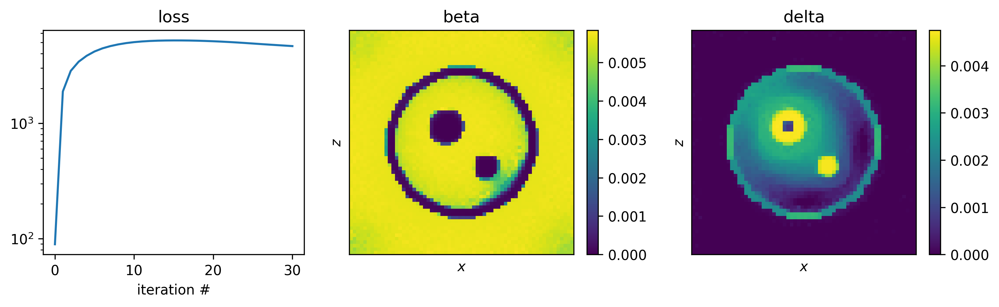


##### | TV_beta: 5.0  | TV_delta: 10.0  | L1_beta: 0.0  | L1_delta: 10.0
iter 30 (t = 18.2 s)


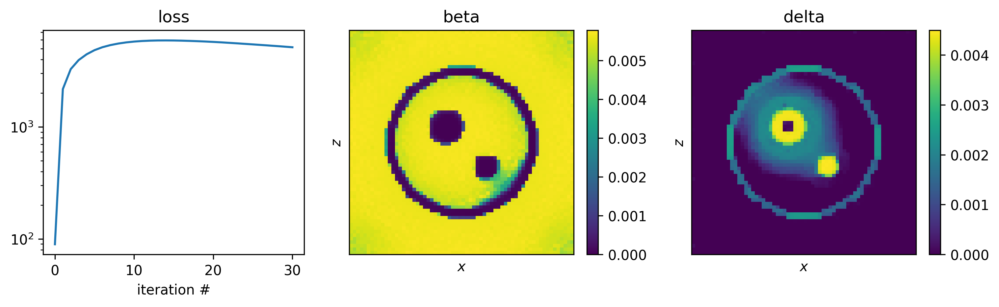


##### | TV_beta: 5.0  | TV_delta: 10.0  | L1_beta: 5.0  | L1_delta: 0.0
iter 30 (t = 18.0 s)


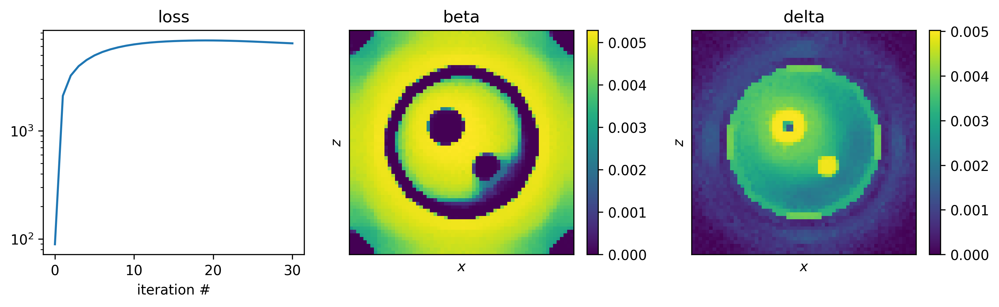


##### | TV_beta: 5.0  | TV_delta: 10.0  | L1_beta: 5.0  | L1_delta: 5.0
iter 30 (t = 18.0 s)


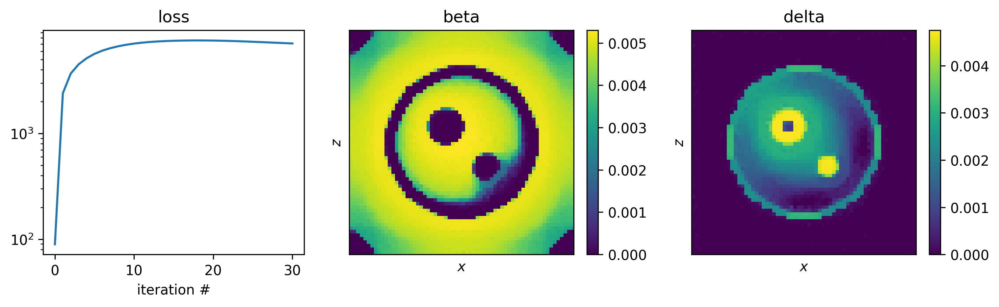


##### | TV_beta: 5.0  | TV_delta: 10.0  | L1_beta: 5.0  | L1_delta: 10.0
iter 30 (t = 18.1 s)


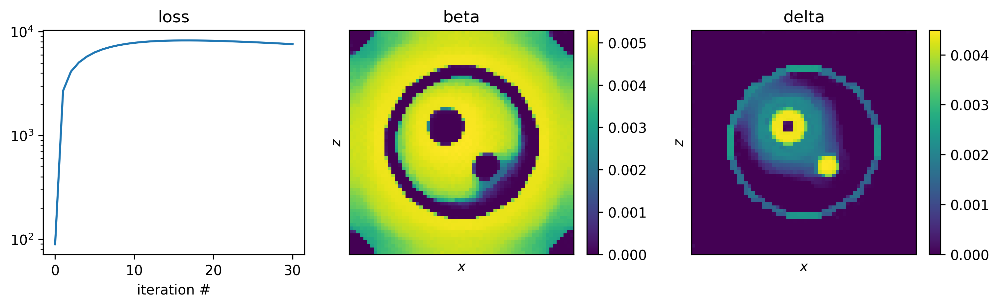


##### | TV_beta: 5.0  | TV_delta: 10.0  | L1_beta: 10.0  | L1_delta: 0.0
iter 30 (t = 17.9 s)


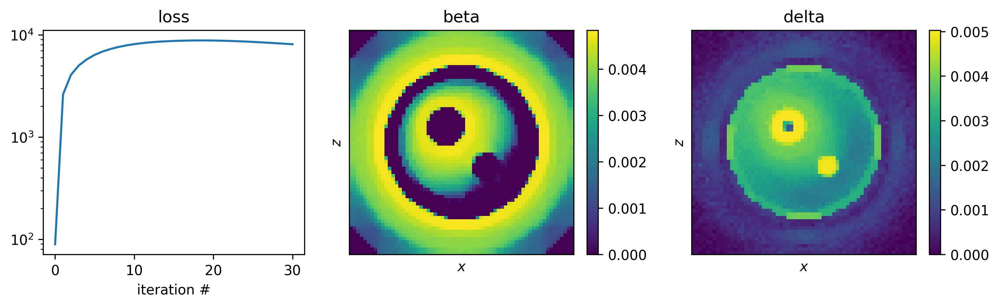


##### | TV_beta: 5.0  | TV_delta: 10.0  | L1_beta: 10.0  | L1_delta: 5.0
iter 30 (t = 18.0 s)


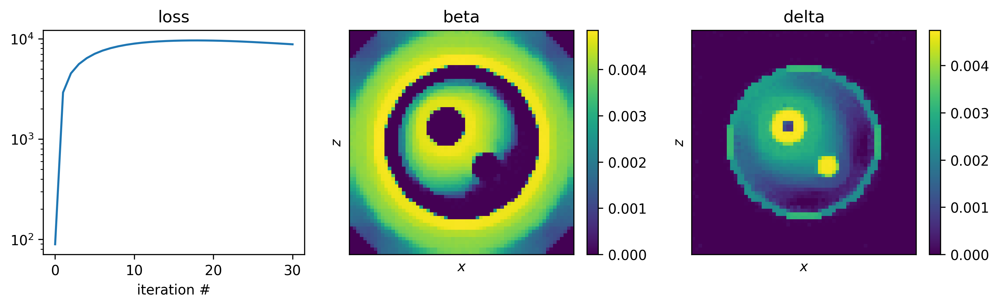


##### | TV_beta: 5.0  | TV_delta: 10.0  | L1_beta: 10.0  | L1_delta: 10.0
iter 30 (t = 17.8 s)


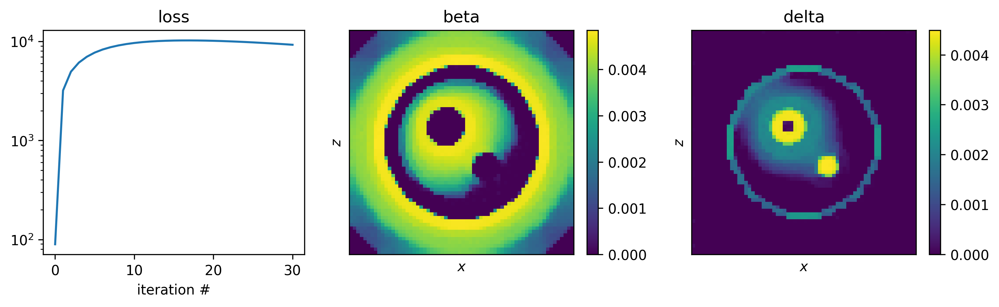


##### | TV_beta: 10.0  | TV_delta: 0.0  | L1_beta: 0.0  | L1_delta: 0.0
iter 30 (t = 17.6 s)


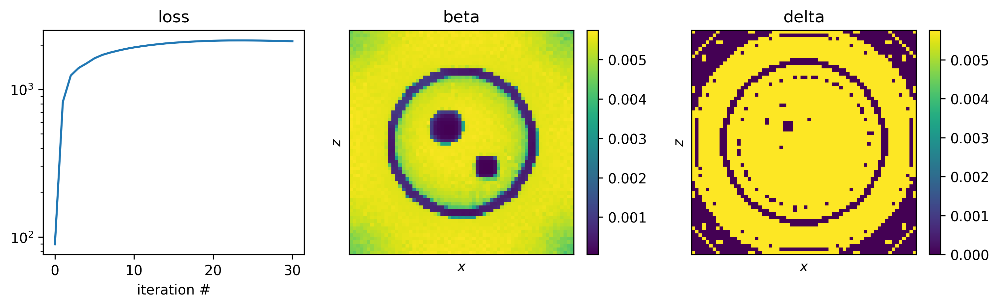


##### | TV_beta: 10.0  | TV_delta: 0.0  | L1_beta: 0.0  | L1_delta: 5.0
iter 30 (t = 17.6 s)


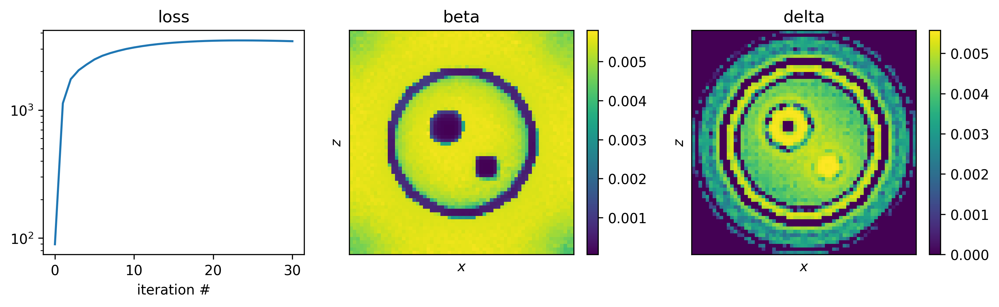


##### | TV_beta: 10.0  | TV_delta: 0.0  | L1_beta: 0.0  | L1_delta: 10.0
iter 30 (t = 17.8 s)


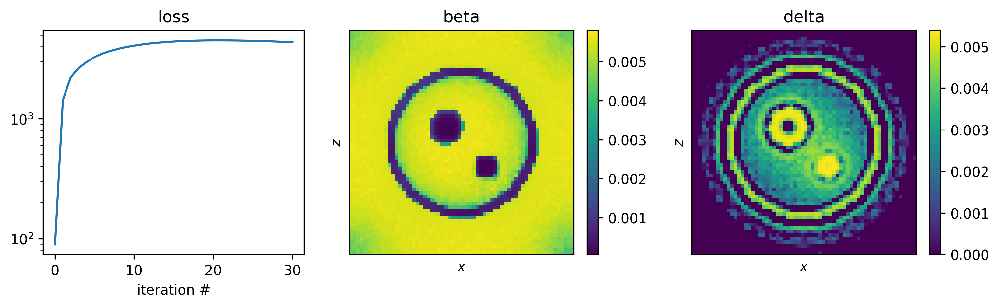


##### | TV_beta: 10.0  | TV_delta: 0.0  | L1_beta: 5.0  | L1_delta: 0.0
iter 30 (t = 17.7 s)


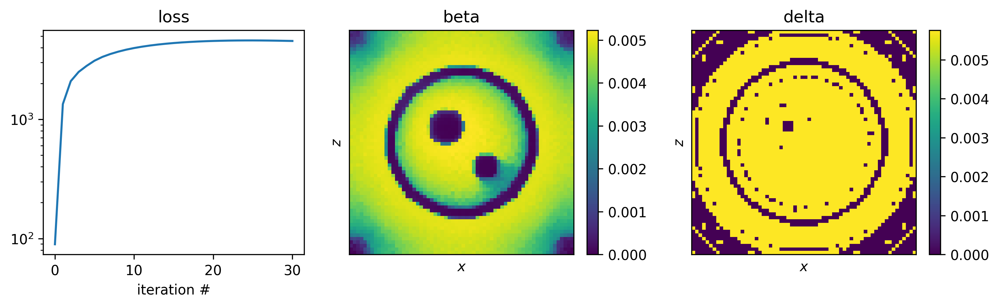


##### | TV_beta: 10.0  | TV_delta: 0.0  | L1_beta: 5.0  | L1_delta: 5.0
iter 30 (t = 17.7 s)


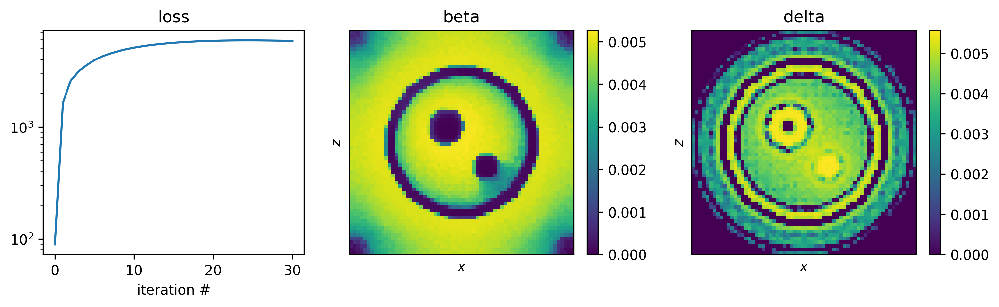


##### | TV_beta: 10.0  | TV_delta: 0.0  | L1_beta: 5.0  | L1_delta: 10.0
iter 30 (t = 17.9 s)


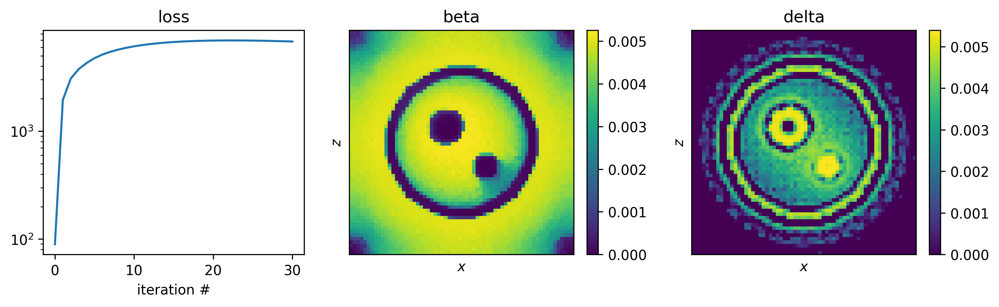


##### | TV_beta: 10.0  | TV_delta: 0.0  | L1_beta: 10.0  | L1_delta: 0.0
iter 30 (t = 17.6 s)


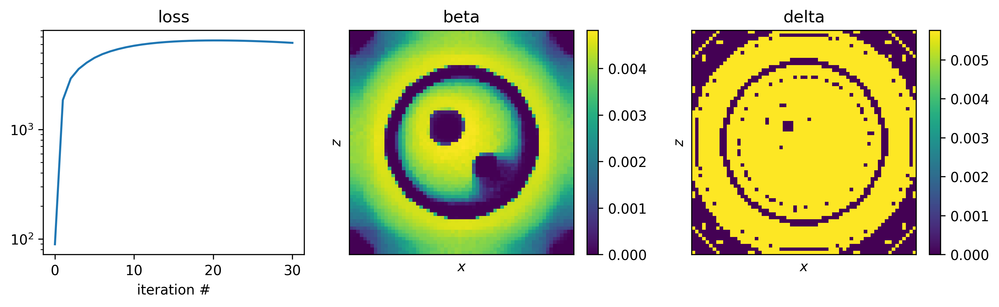


##### | TV_beta: 10.0  | TV_delta: 0.0  | L1_beta: 10.0  | L1_delta: 5.0
iter 30 (t = 17.8 s)


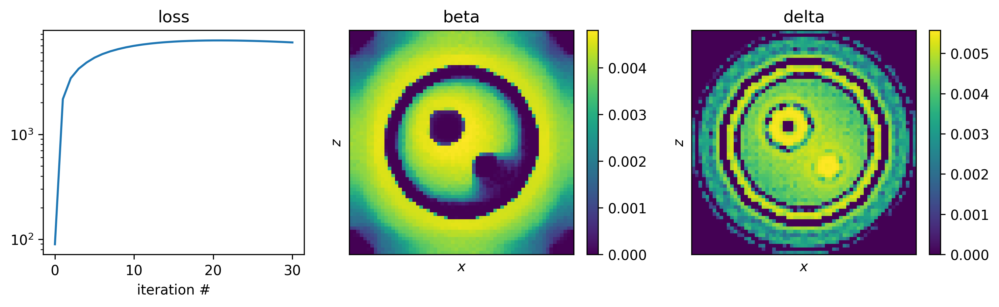


##### | TV_beta: 10.0  | TV_delta: 0.0  | L1_beta: 10.0  | L1_delta: 10.0
iter 30 (t = 17.6 s)


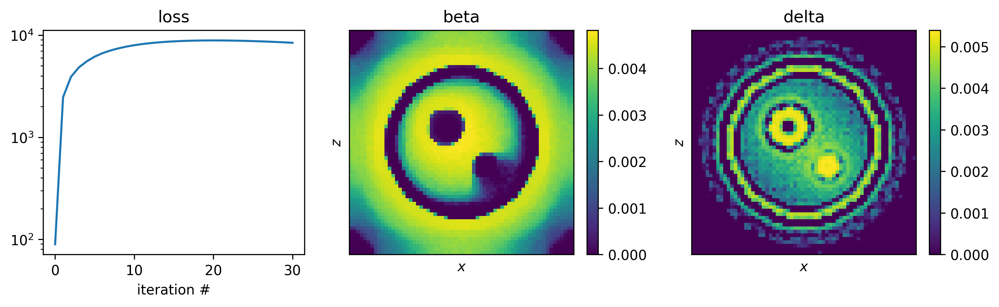


##### | TV_beta: 10.0  | TV_delta: 5.0  | L1_beta: 0.0  | L1_delta: 0.0
iter 30 (t = 18.3 s)


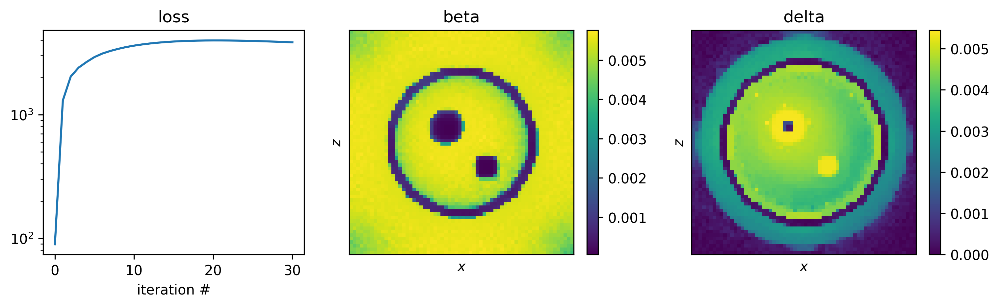


##### | TV_beta: 10.0  | TV_delta: 5.0  | L1_beta: 0.0  | L1_delta: 5.0
iter 30 (t = 18.2 s)


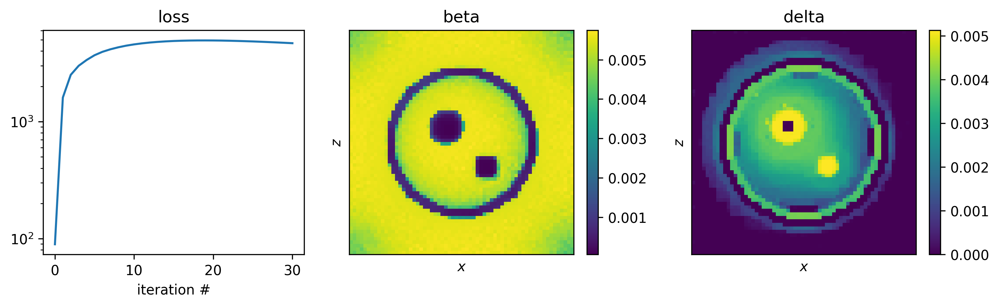


##### | TV_beta: 10.0  | TV_delta: 5.0  | L1_beta: 0.0  | L1_delta: 10.0
iter 30 (t = 18.0 s)


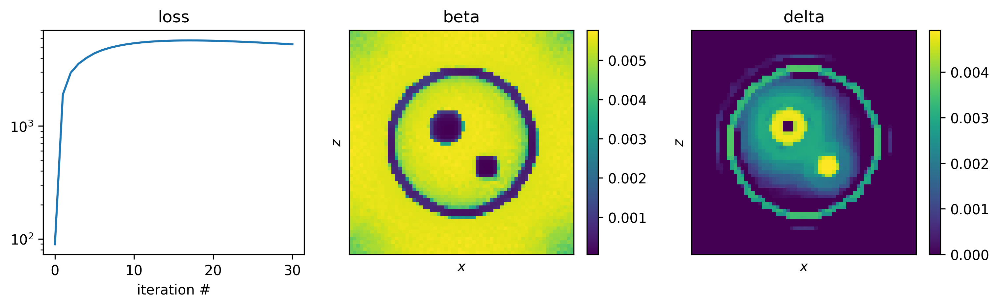


##### | TV_beta: 10.0  | TV_delta: 5.0  | L1_beta: 5.0  | L1_delta: 0.0
iter 30 (t = 18.0 s)


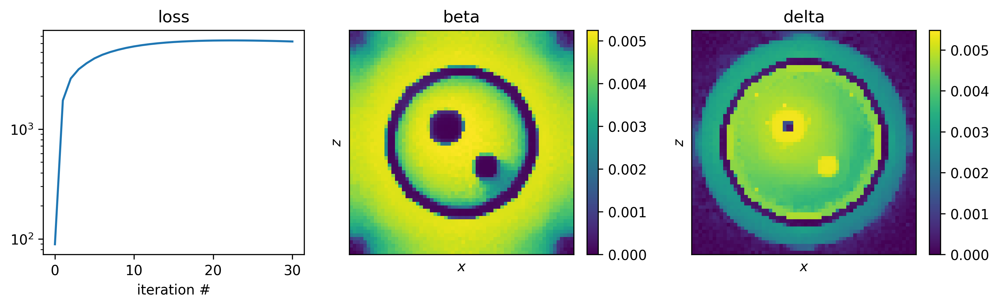


##### | TV_beta: 10.0  | TV_delta: 5.0  | L1_beta: 5.0  | L1_delta: 5.0
iter 30 (t = 18.0 s)


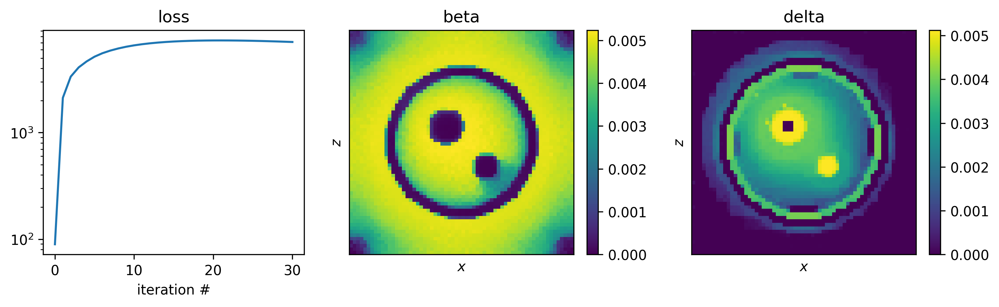


##### | TV_beta: 10.0  | TV_delta: 5.0  | L1_beta: 5.0  | L1_delta: 10.0
iter 30 (t = 17.9 s)


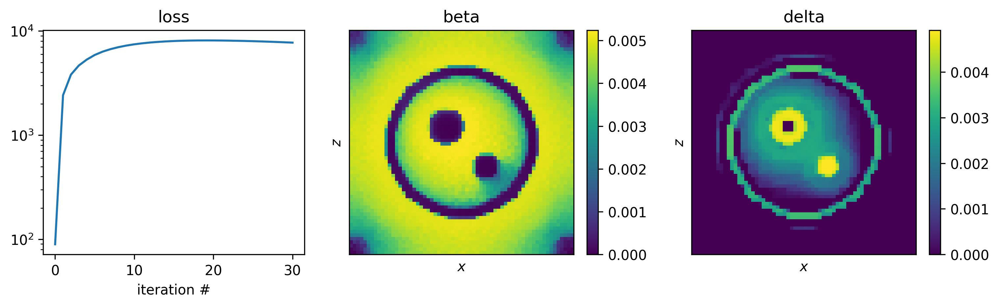


##### | TV_beta: 10.0  | TV_delta: 5.0  | L1_beta: 10.0  | L1_delta: 0.0
iter 30 (t = 18.0 s)


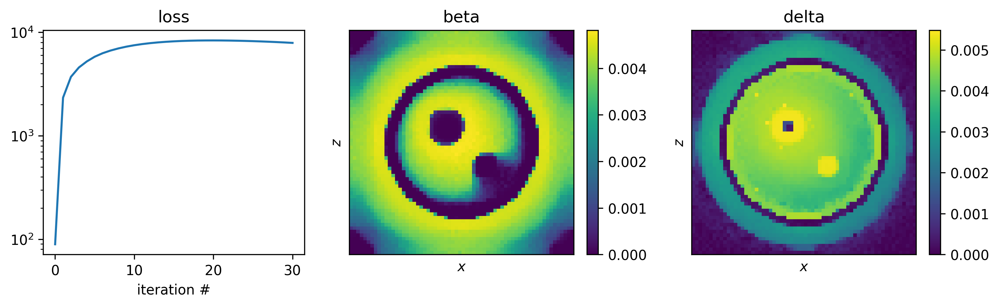


##### | TV_beta: 10.0  | TV_delta: 5.0  | L1_beta: 10.0  | L1_delta: 5.0
iter 30 (t = 18.2 s)


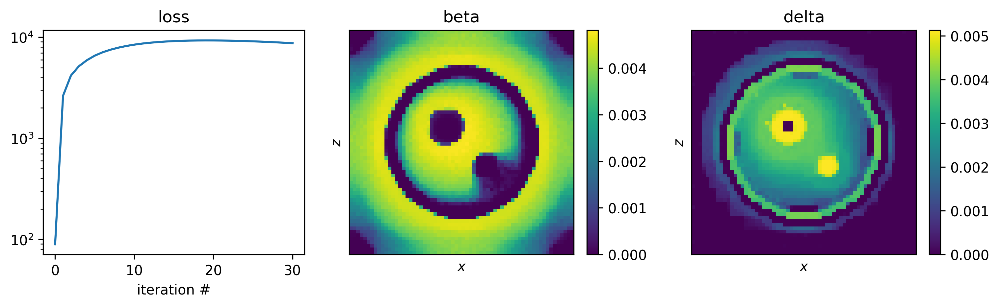


##### | TV_beta: 10.0  | TV_delta: 5.0  | L1_beta: 10.0  | L1_delta: 10.0
iter 30 (t = 17.8 s)


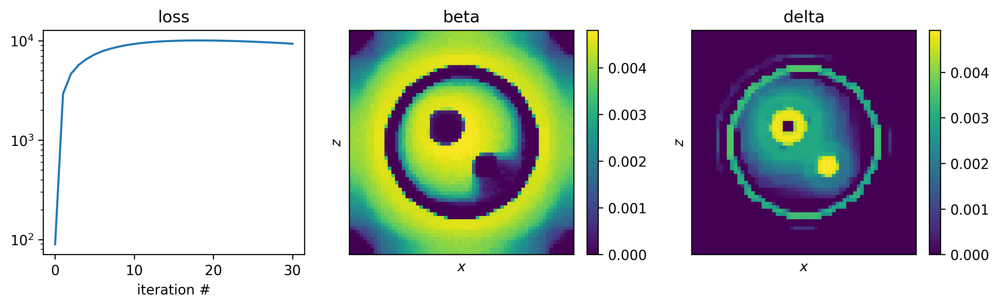


##### | TV_beta: 10.0  | TV_delta: 10.0  | L1_beta: 0.0  | L1_delta: 0.0
iter 30 (t = 17.9 s)


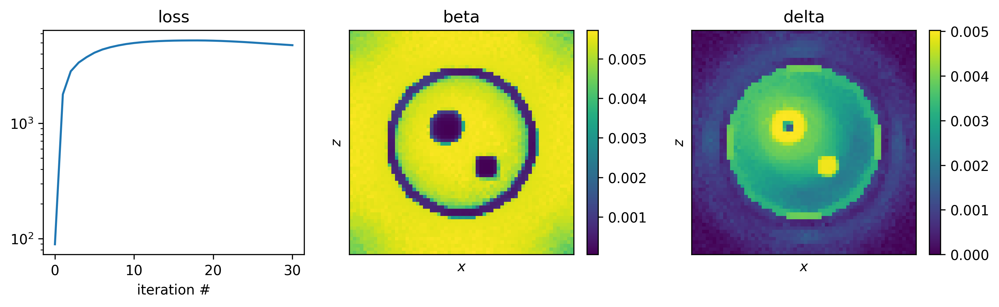


##### | TV_beta: 10.0  | TV_delta: 10.0  | L1_beta: 0.0  | L1_delta: 5.0
iter 30 (t = 17.8 s)


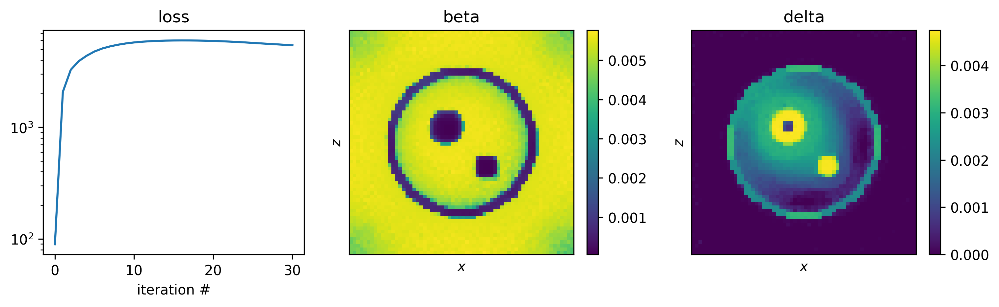


##### | TV_beta: 10.0  | TV_delta: 10.0  | L1_beta: 0.0  | L1_delta: 10.0
iter 30 (t = 18.1 s)


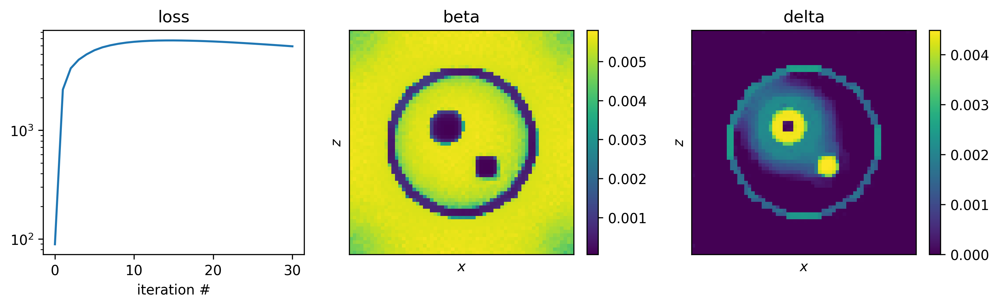


##### | TV_beta: 10.0  | TV_delta: 10.0  | L1_beta: 5.0  | L1_delta: 0.0
iter 30 (t = 18.3 s)


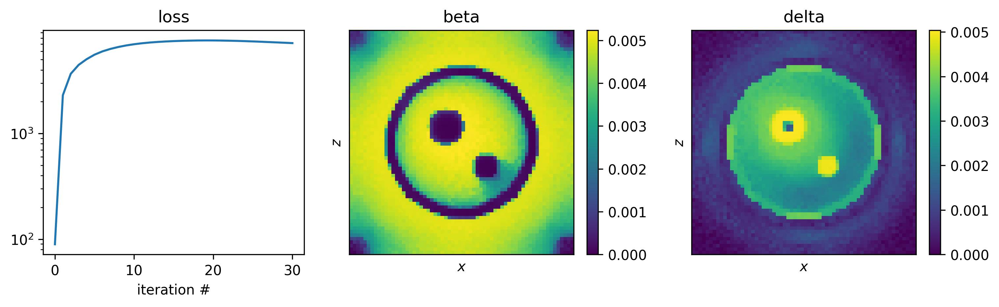


##### | TV_beta: 10.0  | TV_delta: 10.0  | L1_beta: 5.0  | L1_delta: 5.0
iter 30 (t = 18.1 s)


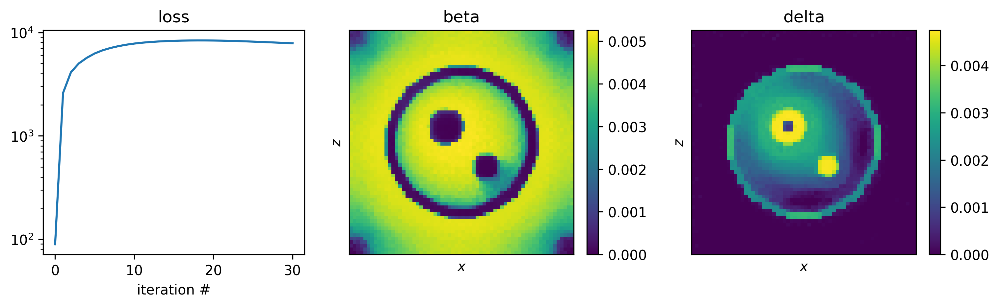


##### | TV_beta: 10.0  | TV_delta: 10.0  | L1_beta: 5.0  | L1_delta: 10.0
iter 30 (t = 18.1 s)


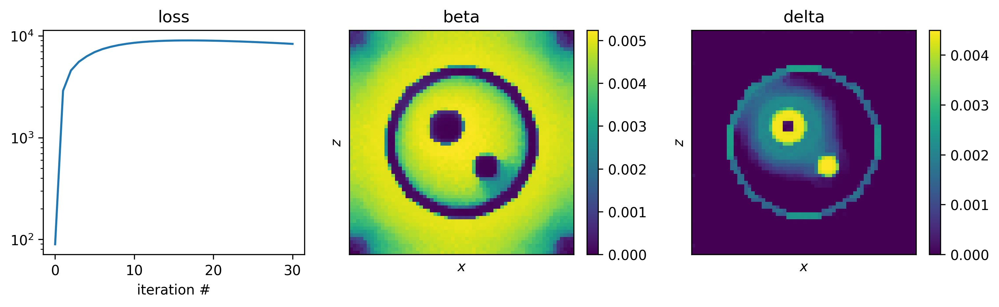


##### | TV_beta: 10.0  | TV_delta: 10.0  | L1_beta: 10.0  | L1_delta: 0.0
iter 30 (t = 17.8 s)


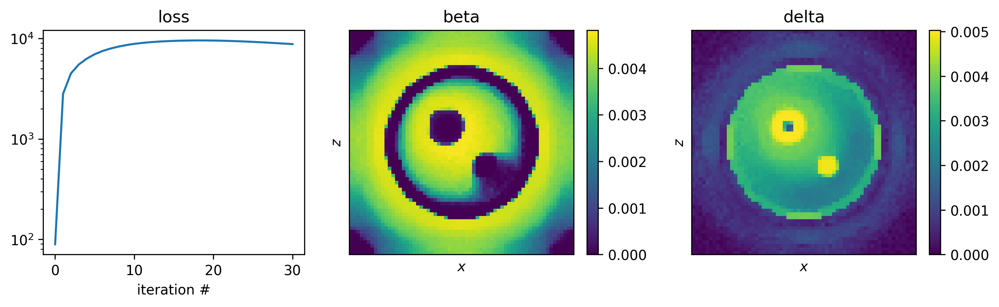


##### | TV_beta: 10.0  | TV_delta: 10.0  | L1_beta: 10.0  | L1_delta: 5.0
iter 30 (t = 18.0 s)


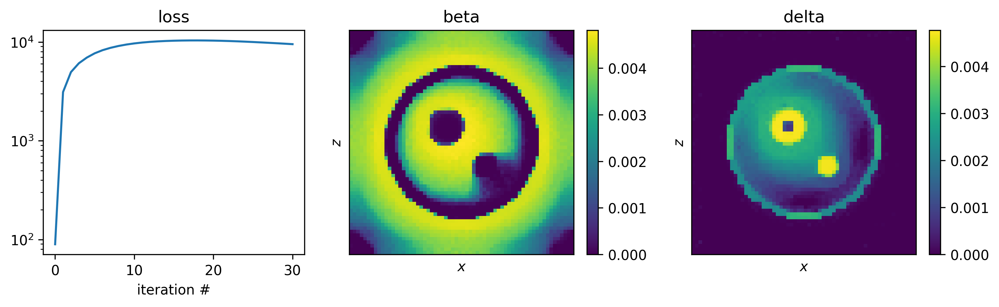


##### | TV_beta: 10.0  | TV_delta: 10.0  | L1_beta: 10.0  | L1_delta: 10.0
iter 30 (t = 17.9 s)


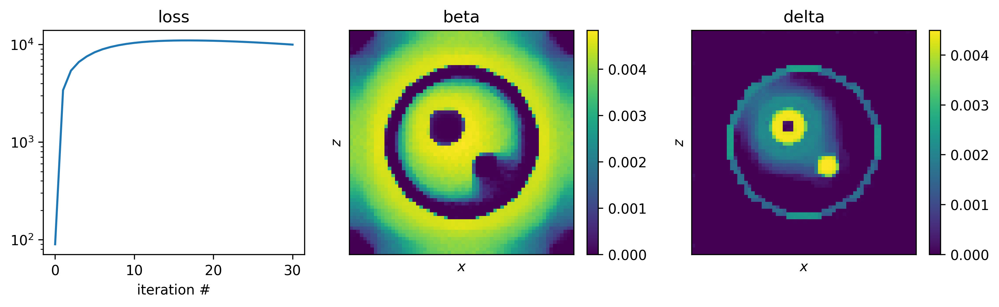

In [9]:

LRATE = 1e-3
EPS = 1e-8
MAX_ITER = 10  # make this larger

# Simple sweep ranges to start:
tv_delta_weights = jnp.array([0, 5, 10])
tv_beta_weights = jnp.array([0, 5, 10])
l1_delta_weights = jnp.array([0, 5, 10])
l1_beta_weights = jnp.array([0, 5, 10])

# Possible considerations for later:
### ground truth delta ~ 1e-6 and beta ~ 1e-9
### L1 (sparsity) ~ 5% of L2 fidelity term
### TV (smoothness) ~ 10-15% of L2 fidelity term

# Optimize & sweep over all possible combinations of weights:
wts_shape = (len(tv_beta_weights), len(tv_delta_weights), len(l1_beta_weights), len(l1_delta_weights))
vol_grid = np.zeros(wts_shape + delta_beta_phantom.shape)
rmse_grid = np.zeros(wts_shape)

for i, j, k, l in product(range(len(tv_beta_weights)), 
                          range(len(tv_delta_weights)), 
                          range(len(l1_beta_weights)), 
                          range(len(l1_delta_weights))):

    w_tv_beta = tv_beta_weights[i]
    w_tv_delta = tv_delta_weights[j]
    w_l1_beta = l1_beta_weights[k]
    w_l1_delta = l1_delta_weights[l]

    print()
    print(f'##### | TV_beta: {w_tv_beta:.1f}  | TV_delta: {w_tv_delta:.1f}  | L1_beta: {w_l1_beta:.1f}  | L1_delta: {w_l1_delta:.1f}')
        
    def loss_fn(params, data):
        vol = params['params']['volume']
        vol_beta, vol_delta = vol[:,:,:,0], vol[:,:,:,1]   
        y_k = forward(params, thetas)   
        L2_norm = jnp.sqrt(jnp.sum((y_k - data)**2)) 
        L1_delta_term = w_l1_delta*L1(vol_delta)            
        L1_beta_term = w_l1_beta*L1(vol_beta)
        TV_delta_term = w_tv_delta*TV(vol_delta)
        TV_beta_term = w_tv_beta*TV(vol_beta)
        loss = L2_norm + L1_delta_term + L1_beta_term + TV_delta_term + TV_beta_term 
        return loss
    
    @jax.jit  
    def update(params, opt_state, *args):
        loss, grads = jax.value_and_grad(loss_fn)(params, *args)
        updates, opt_state = optimizer.update(grads, opt_state, params,value=loss, grad=grads, value_fn=loss_fn)
        params = projection_non_negative(optax.apply_updates(params, updates))
        return params, opt_state, loss
    
    ###################################

    optimizer = optax.adam(learning_rate=LRATE, eps=EPS)

    # Init the model
    key = jax.random.PRNGKey(3)
    model = MultiSlicePBI()
    params = model.init(key, 0)
    forward = jax.vmap(model.apply, in_axes=(None, 0))  
    opt_state = optimizer.init(params)  
    
    # Run
    loss = []
    t0 = time()
    for iter_k in range(max_iter):
        params, opt_state, loss_k = update(params, opt_state, data)
        loss.append(loss_k)
    print(f'iter {iter_k} (t = {time() - t0:.1f} s)')
    show_compare(params, loss)  

    # Save the results
    vol_opt = params['params']['volume']    
    vol_grid[i,j,k,l] = vol_opt 
    rmse_grid[i,j,k,l] = calculate_rmse(vol_opt)


TV_beta  range -- min: 0.0 / max: 10.0
TV_delta range -- min: 0.0 / max: 10.0
L1_beta  range -- min: 0.0 / max: 10.0
L1_delta range -- min: 0.0 / max: 10.0
RMSE     range -- min: 0.0031936680898070335 / max: 0.0047121308743953705


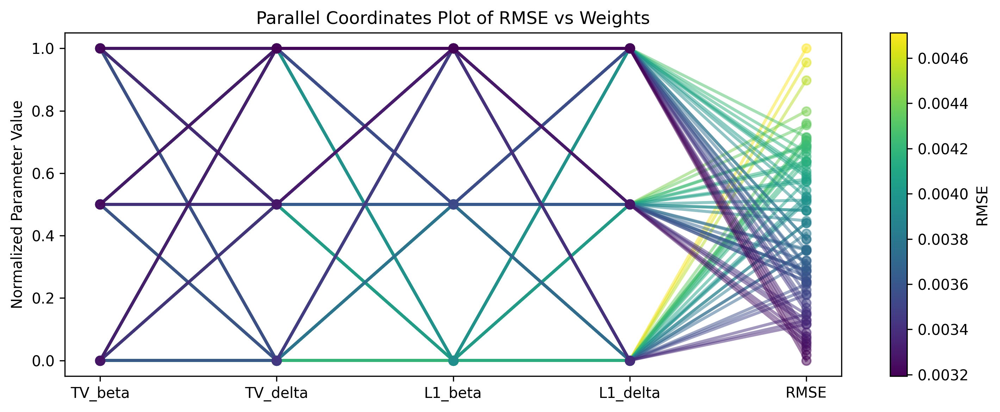

In [10]:
param_names = ['TV_beta', 'TV_delta', 'L1_beta', 'L1_delta', 'RMSE'] 

opt_data = []  
for i, j, k, l in product(range(len(tv_beta_weights)), 
                          range(len(tv_delta_weights)), 
                          range(len(l1_beta_weights)), 
                          range(len(l1_delta_weights))):
    row = [from matplotlib.cm import ScalarMappable
import matplotlib.cm as cm
import matplotlib.colors as colorsfrom matplotlib.cm import ScalarMappable
import matplotlib.cm as cm
import matplotlib.colors as colors
        tv_beta_weights[i],
        tv_delta_weights[j],
        l1_beta_weights[k],
        l1_delta_weights[l],
        rmse_grid[i, j, k, l]
    ]
    opt_data.append(row)

# Sort the opt_data so that the "best rows" (lowest RMSE, lowest item for [row,6]) are FIRST
opt_data = np.array(opt_data)
opt_data = opt_data[np.argsort(opt_data[:, -1])]

# Normalize parameter values to range from 0 to 1 (visualization purposes only)
opt_data_norm = opt_data.copy()
for i in range(opt_data.shape[1]): 
    col_min = opt_data[:, i].min()
    col_max = opt_data[:, i].max()
    print(f'{param_names[i]:8} range -- min: {col_min} / max: {col_max}')
    opt_data_norm[:, i] = (opt_data[:, i] - col_min) / (col_max - col_min)

# Normalize FOM for color mapping (visualization purposes only)
rmse_values = opt_data[:, -1]
norm = colors.Normalize(vmin=rmse_values.min(), vmax=rmse_values.max())
cmap = cm.viridis
sm = ScalarMappable(norm=norm, cmap=cmap)

# Plot
fig, ax = plt.subplots(figsize=(10, 4), dpi=300)
for i in list(range(opt_data.shape[0]))[::-1]:
    ax.plot(range(len(param_names)), opt_data_norm[i], color=cmap(norm(rmse_values[i])), alpha=0.5, ls='-', marker='o', lw=2)

ax.set_xticks(range(len(param_names)))
ax.set_xticklabels(param_names)
ax.set_ylabel('Normalized Parameter Value')
ax.set_title('Parallel Coordinates Plot of RMSE vs Weights')

# Add colorbar
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('RMSE')

plt.tight_layout()
plt.show()

In [16]:
# The weights yielding lowest RMSE are probably best, so check:
for i in range(9):
    print(f'rank {i+1} weights =', opt_data[i][:-1].astype(int), f'---> RMSE = {opt_data[i][-1]:.3e}')

rank 1 weights = [10 10 10 10] ---> RMSE = 3.194e-03
rank 2 weights = [ 5 10 10 10] ---> RMSE = 3.220e-03
rank 3 weights = [ 0 10 10 10] ---> RMSE = 3.245e-03
rank 4 weights = [10 10 10  5] ---> RMSE = 3.262e-03
rank 5 weights = [10  5 10 10] ---> RMSE = 3.276e-03
rank 6 weights = [ 5 10 10  5] ---> RMSE = 3.285e-03
rank 7 weights = [ 5  5 10 10] ---> RMSE = 3.301e-03
rank 8 weights = [ 0 10 10  5] ---> RMSE = 3.310e-03
rank 9 weights = [ 0  5 10 10] ---> RMSE = 3.329e-03
